<a href="https://colab.research.google.com/github/WillSAdkins/MSc_project_EEG/blob/main/Analysis_multimodal_hypothesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [2]:
from zipfile import ZipFile
import pandas as pd
from sklearn.model_selection import train_test_split
import string
import numpy as np
#!pip install tensorflow
#import tensorflow as tf
from sklearn.preprocessing import Normalizer
from sklearn.decomposition import PCA
# !pip install keras
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout, Conv2D, Flatten
from sklearn.metrics import accuracy_score, mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from sklearn.preprocessing import OneHotEncoder
!pip install tqdm
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
import seaborn as sns
import glob
#import cv2
import gc
!pip install mne
import mne
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
import time
import pickle
from mne.preprocessing import create_ecg_epochs
from scipy.interpolate import Rbf


def save_model_json(model, filename):
    # serialize model to JSON
    model_json = model.to_json()
    with open(f"{filename}.json", "w") as json_file:
        json_file.write(model_json)
    # serialize weights to HDF5
    model.save_weights(f"{filename}.h5")
    print(f"Saved {filename} to disk")



def load_model_json(filename):
    # load json and create model
    json_file = open(f'{filename}.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    # load weights into new model
    loaded_model.load_weights(f"{filename}.h5")
    print(f"Loaded {filename} from disk")
    return loaded_model

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 7.5 MB 5.0 MB/s 


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Handle data

In [4]:
from warnings import resetwarnings
# Load the data in...
dir_path = "/content/drive/MyDrive/Bath/Dissertation/Analysis/Participants/"
participant = 'Will Adkins'
with ZipFile(dir_path + participant + '/' + 'recordings.zip', 'r') as zip_file:
    print(zip_file)
    print(zip_file.printdir())
    zip_file.extractall()

speaking1 = pd.read_csv('Labelled/speaking1_labelled.csv')
speaking2 = pd.read_csv('Labelled/speaking2_labelled.csv')
speaking3 = pd.read_csv('Labelled/speaking3_labelled.csv')
speaking4 = pd.read_csv('Labelled/speaking4_labelled.csv')
speaking5 = pd.read_csv('Labelled/speaking5_labelled.csv')
speaking6 = pd.read_csv('Labelled/speaking6_labelled.csv')
speaking7 = pd.read_csv('Labelled/speaking7_labelled.csv')
speaking8 = pd.read_csv('Labelled/speaking8_labelled.csv')
speaking9 = pd.read_csv('Labelled/speaking9_labelled.csv')
speaking10 = pd.read_csv('Labelled/speaking10_labelled.csv')
stimuli = pd.read_csv('Labelled/stimuli_labelled.csv')

<zipfile.ZipFile filename='/content/drive/MyDrive/Bath/Dissertation/Analysis/Participants/Will Adkins/recordings.zip' mode='r'>
File Name                                             Modified             Size
Labelled/speaking1_labelled.csv                2022-08-16 21:21:12     15114626
Labelled/speaking10_labelled.csv               2022-08-16 21:30:14     15179879
Labelled/speaking2_labelled.csv                2022-08-16 21:21:26     15110768
Labelled/speaking3_labelled.csv                2022-08-16 21:28:48     15115698
Labelled/speaking4_labelled.csv                2022-08-16 21:28:58     15114684
Labelled/speaking5_labelled.csv                2022-08-16 21:29:12     15115122
Labelled/speaking6_labelled.csv                2022-08-16 21:29:26     15114730
Labelled/speaking7_labelled.csv                2022-08-16 21:29:36     15113094
Labelled/speaking8_labelled.csv                2022-08-16 21:29:48     15111734
Labelled/speaking9_labelled.csv                2022-08-16 21:30:04     1

In [5]:
n_epochs = stimuli['Epoch'].iloc[-1] + 1 # Set the number of epochs as a variable for reference, and in the case we need to use it

In [6]:
# Create a speaking dataset that is the concatenation of each of the 10 speaking datasets for each repeat, whilst preserving order to the epochs...
speaking = pd.concat([speaking1, speaking2, speaking3, speaking4, speaking5, speaking6, speaking7, speaking8, speaking9, speaking10], axis = 0)

In [7]:
# it can be seen that one epoch of speaking data contains 512 recordings (256 recordings per second for 2 seconds) of 14 channels, 
# with the two reference channels included in the dataset aswell.
speaking[speaking['Epoch'] == 0]

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
0,23.000000,0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,...,4207.692383,4225.000000,4238.461426,4236.410156,4243.077148,4103.846191,4229.871582,Lamp,audio,speaking1
1,23.003906,0,4226.025879,4236.538574,4243.589844,4228.717773,4232.436035,4200.512695,4238.077148,4205.897461,...,4233.974121,4237.563965,4242.692383,4101.282227,4230.384766,4238.717773,4239.487305,Lamp,audio,speaking1
2,23.007812,0,4247.948730,4230.897461,4240.128418,4240.256348,4238.846191,4207.692383,4222.307617,4234.487305,...,4245.769043,4104.487305,4235.512695,4251.410156,4246.282227,4255.256348,4236.794922,Lamp,audio,speaking1
3,23.011719,0,4249.743652,4271.282227,4243.974121,4212.436035,4227.051270,4239.871582,4248.333496,4251.025879,...,4243.077148,4258.846191,4253.974121,4262.051270,4243.461426,4256.025879,4276.922852,Lamp,audio,speaking1
4,23.015625,0,4251.922852,4218.461426,4234.871582,4247.307617,4252.948730,4256.282227,4117.820313,4248.974121,...,4258.205078,4265.128418,4246.922852,4255.897461,4254.487305,4259.358887,4224.102539,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,42.980469,0,4253.589844,4245.897461,4260.000000,4242.820313,4232.051270,4250.000000,4202.436035,4279.230957,...,4256.538574,4251.153809,4306.538574,4283.205078,4261.666504,4253.846191,4244.230957,Lamp,audio,speaking10
508,42.984375,0,4256.666504,4243.333496,4230.384766,4249.743652,4202.820313,4273.589844,4232.820313,4254.615234,...,4308.205078,4284.743652,4261.538574,4251.282227,4243.077148,4259.358887,4245.000000,Lamp,audio,speaking10
509,42.988281,0,4226.794922,4249.615234,4202.820313,4269.102539,4232.307617,4255.512695,4253.589844,4309.615234,...,4261.794922,4247.820313,4241.794922,4265.641113,4246.282227,4222.436035,4247.436035,Lamp,audio,speaking10
510,42.992188,0,4201.282227,4267.051270,4231.538574,4258.717773,4253.717773,4310.000000,4280.641113,4261.410156,...,4240.256348,4270.641113,4245.641113,4218.846191,4242.692383,4198.717773,4267.948730,Lamp,audio,speaking10


In [8]:
# Speaking dataset contains 10 2 second windows per epoch for 130 epochs, with 512 time points with 14 channels per time point plus other info. 
# Leading to 665600 time recordings/samples/exanplars with 14 features
# (For those datasets that are complete !)
speaking

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
0,23.000000,0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,...,4207.692383,4225.000000,4238.461426,4236.410156,4243.077148,4103.846191,4229.871582,Lamp,audio,speaking1
1,23.003906,0,4226.025879,4236.538574,4243.589844,4228.717773,4232.436035,4200.512695,4238.077148,4205.897461,...,4233.974121,4237.563965,4242.692383,4101.282227,4230.384766,4238.717773,4239.487305,Lamp,audio,speaking1
2,23.007812,0,4247.948730,4230.897461,4240.128418,4240.256348,4238.846191,4207.692383,4222.307617,4234.487305,...,4245.769043,4104.487305,4235.512695,4251.410156,4246.282227,4255.256348,4236.794922,Lamp,audio,speaking1
3,23.011719,0,4249.743652,4271.282227,4243.974121,4212.436035,4227.051270,4239.871582,4248.333496,4251.025879,...,4243.077148,4258.846191,4253.974121,4262.051270,4243.461426,4256.025879,4276.922852,Lamp,audio,speaking1
4,23.015625,0,4251.922852,4218.461426,4234.871582,4247.307617,4252.948730,4256.282227,4117.820313,4248.974121,...,4258.205078,4265.128418,4246.922852,4255.897461,4254.487305,4259.358887,4224.102539,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66555,4503.980469,129,4298.077148,4299.871582,4241.410156,4241.794922,4231.922852,4237.563965,4242.563965,4256.410156,...,4245.512695,4339.615234,4260.128418,4226.025879,4289.615234,4300.897461,4301.794922,Clock,text,speaking10
66556,4503.984375,129,4243.717773,4242.051270,4232.179688,4238.589844,4242.948730,4256.794922,4218.589844,4244.358887,...,4254.487305,4225.384766,4285.128418,4298.717773,4300.641113,4244.358887,4240.897461,Clock,text,speaking10
66557,4503.988281,129,4232.307617,4238.333496,4238.077148,4255.384766,4217.948730,4242.692383,4334.743652,4249.615234,...,4277.692383,4293.717773,4297.948730,4243.846191,4239.743652,4232.820313,4237.563965,Clock,text,speaking10
66558,4503.992188,129,4230.769043,4254.230957,4218.461426,4243.205078,4332.563965,4244.230957,4218.589844,4271.922852,...,4296.153809,4242.563965,4239.743652,4233.461426,4236.922852,4225.512695,4255.384766,Clock,text,speaking10


In [9]:
def Handle(dataframe):
    
    features = dataframe.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Label', 'Mode of Stimulus']).to_numpy().reshape(dataframe.shape[0] // (512), 512 * 14)
    targets = dataframe['Label'].to_numpy().reshape(dataframe.shape[0] // (512), 512)[:, 0]
    modes_of_stimuli = dataframe['Mode of Stimulus'].to_numpy().reshape(dataframe.shape[0] // (512), 512)[:, 0]
    return features, targets, modes_of_stimuli
features, targets, modes_of_stimuli = Handle(speaking)
stimuli_features, stimuli_targets, modes_of_stimuli_stimstage = Handle(stimuli)
pd.DataFrame(features)

,0,1,2,3,4,5,6,7,8,9,...,7158,7159,7160,7161,7162,7163,7164,7165,7166,7167
0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,4241.153809,4207.692383,...,4267.307617,4206.538574,4266.410156,4250.128418,4261.794922,4243.846191,4225.897461,4225.897461,4313.333496,4267.820313
1,4236.410156,4217.563965,4231.538574,4260.128418,4134.615234,4234.615234,4211.538574,4221.025879,4248.846191,4264.743652,...,4268.974121,4247.051270,4242.307617,4177.820313,4133.974121,4197.179688,4285.384766,4223.717773,4187.051270,4246.538574
2,4175.769043,4139.487305,4504.871582,4074.743652,4119.358887,4188.974121,4196.410156,4090.769287,4056.410156,4183.846191,...,4061.923096,4431.538574,4273.974121,4289.487305,4293.205078,4302.563965,4366.666504,4295.769043,4259.102539,4215.769043
3,4204.230957,4197.948730,4208.461426,4174.230957,4182.948730,4203.333496,4201.794922,4598.589844,4220.384766,4232.307617,...,4205.512695,4314.743652,4266.153809,4261.922852,4255.512695,4262.307617,4260.512695,4258.846191,4248.205078,4150.128418
4,4251.538574,4295.769043,4109.615234,4358.589844,4182.179688,4241.153809,4217.179688,4272.692383,4322.051270,4294.615234,...,4218.589844,4220.512695,4221.538574,4231.025879,4202.820313,4185.512695,4199.487305,4131.538574,4191.025879,4257.692383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1295,4247.692383,4245.256348,4230.897461,4236.282227,4247.179688,4250.128418,4233.205078,4238.333496,4230.000000,4260.512695,...,4261.666504,4240.128418,4247.307617,4262.820313,4252.051270,4310.000000,4224.230957,4253.077148,4255.641113,4258.589844
1296,4254.230957,4288.205078,4251.794922,4255.128418,4247.692383,4248.589844,4261.153809,4255.641113,4249.743652,4243.589844,...,4226.922852,4227.307617,4230.769043,4237.051270,4244.743652,4228.077148,4227.436035,4242.179688,4233.461426,4276.666504
1297,4245.000000,4251.922852,4250.256348,4247.692383,4256.153809,4244.102539,4243.717773,4253.846191,4233.077148,4273.589844,...,4273.205078,4293.974121,4266.794922,4273.333496,4286.794922,4295.769043,4311.538574,4276.410156,4261.794922,4266.025879
1298,4307.820313,4242.948730,4238.333496,4246.282227,4220.769043,4244.871582,4230.256348,4240.256348,4231.666504,4216.282227,...,4262.051270,4259.230957,4239.487305,4257.563965,4294.871582,4282.051270,4246.794922,4234.871582,4279.358887,4270.641113


In [10]:
pd.DataFrame(modes_of_stimuli)

,0
0,audio
1,image
2,image
3,audio
4,text
...,...
1295,image
1296,audio
1297,None
1298,image


In [11]:
audio_ind = np.array(modes_of_stimuli) == 'audio'
audio_feat = features[audio_ind]
audio_targ = targets[audio_ind]

text_ind = np.array(modes_of_stimuli) == 'text'
text_feat = features[text_ind]
text_targ = targets[text_ind]

image_ind = np.array(modes_of_stimuli) == 'image'
image_feat = features[image_ind]
image_targ = targets[image_ind]

In [12]:
stimuli_audio_ind = np.array(modes_of_stimuli_stimstage) == 'audio'
stimuli_audio_feat = stimuli_features[stimuli_audio_ind]
stimuli_audio_targ = stimuli_targets[stimuli_audio_ind]

stimuli_text_ind = np.array(modes_of_stimuli_stimstage) == 'text'
stimuli_text_feat = stimuli_features[stimuli_text_ind]
stimuli_text_targ = stimuli_targets[stimuli_text_ind]

stimuli_image_ind = np.array(modes_of_stimuli_stimstage) == 'image'
stimuli_image_feat = stimuli_features[stimuli_image_ind]
stimuli_image_targ = stimuli_targets[stimuli_image_ind]

# Interpolation of frozen values

In [13]:
tester_array = speaking[['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']]
tester_array = tester_array.to_numpy()
tester_array[0, :] == tester_array[1, :]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False])

In [14]:
repeats_ind = []
non_repeats_ind = [0]
for i in range(1, speaking.shape[0]):
  if (tester_array[i-1, :] == tester_array[i, :]).all():
    repeats_ind.append(i)
  else:
    non_repeats_ind.append(i)

repeats_ind = np.array(repeats_ind, dtype = 'int')
non_repeats_ind = np.array(non_repeats_ind, dtype = 'int')
print(repeats_ind.shape, non_repeats_ind.shape, (repeats_ind.shape[0] + non_repeats_ind.shape[0] == speaking.shape[0]))
repeats_ind, non_repeats_ind

(87110,) (578490,) True


(array([    17,     18,     19, ..., 665575, 665576, 665577]),
 array([     0,      1,      2, ..., 665597, 665598, 665599]))

In [15]:
speaking.iloc[repeats_ind]

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
17,23.066406,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
18,23.070312,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
19,23.074219,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
20,23.078125,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
53,23.207031,0,4267.307617,4259.358887,4149.871582,4265.897461,4242.051270,4248.077148,4261.922852,4234.358887,...,4288.077148,4262.051270,4237.692383,4247.307617,4250.641113,4266.666504,4258.461426,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66501,4503.769531,129,4240.641113,4328.333496,4301.538574,4307.948730,4247.051270,4253.717773,4246.282227,4252.692383,...,4262.179688,4245.769043,4267.307617,4336.922852,4273.205078,4238.205078,4322.051270,Clock,text,speaking10
66534,4503.898438,129,4270.000000,4277.179688,4256.282227,4272.820313,4355.512695,4298.077148,4236.538574,4299.871582,...,4315.384766,4246.666504,4253.717773,4250.128418,4250.256348,4264.487305,4278.205078,Clock,text,speaking10
66535,4503.902344,129,4270.000000,4277.179688,4256.282227,4272.820313,4355.512695,4298.077148,4236.538574,4299.871582,...,4315.384766,4246.666504,4253.717773,4250.128418,4250.256348,4264.487305,4278.205078,Clock,text,speaking10
66536,4503.906250,129,4270.000000,4277.179688,4256.282227,4272.820313,4355.512695,4298.077148,4236.538574,4299.871582,...,4315.384766,4246.666504,4253.717773,4250.128418,4250.256348,4264.487305,4278.205078,Clock,text,speaking10


In [16]:
epoch_relative_indicies = pd.DataFrame((list(np.arange(1, 513)) * n_epochs * 10)[:speaking.shape[0]], columns = ['Time Index'])
print(len(epoch_relative_indicies), n_epochs)
pd.concat([speaking, epoch_relative_indicies])
speaking['Time Index'] = epoch_relative_indicies['Time Index']
non_repeats_data = speaking.iloc[non_repeats_ind].drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label'])
repeats_data = speaking.iloc[repeats_ind].drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label'])
non_repeats_data

665600 130


,F3,FC5,AF3,F7,T7,P7,O1,O2,P8,T8,F8,AF4,FC6,F4,Time Index
0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,4241.153809,4207.692383,4225.000000,4238.461426,4236.410156,4243.077148,1
1,4226.025879,4236.538574,4243.589844,4228.717773,4232.436035,4200.512695,4238.077148,4205.897461,4221.922852,4233.974121,4237.563965,4242.692383,4101.282227,4230.384766,2
2,4247.948730,4230.897461,4240.128418,4240.256348,4238.846191,4207.692383,4222.307617,4234.487305,4242.307617,4245.769043,4104.487305,4235.512695,4251.410156,4246.282227,3
3,4249.743652,4271.282227,4243.974121,4212.436035,4227.051270,4239.871582,4248.333496,4251.025879,4111.153809,4243.077148,4258.846191,4253.974121,4262.051270,4243.461426,4
4,4251.922852,4218.461426,4234.871582,4247.307617,4252.948730,4256.282227,4117.820313,4248.974121,4259.102539,4258.205078,4265.128418,4246.922852,4255.897461,4254.487305,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66555,4298.077148,4299.871582,4241.410156,4241.794922,4231.922852,4237.563965,4242.563965,4256.410156,4218.333496,4245.512695,4339.615234,4260.128418,4226.025879,4289.615234,508
66556,4243.717773,4242.051270,4232.179688,4238.589844,4242.948730,4256.794922,4218.589844,4244.358887,4337.692383,4254.487305,4225.384766,4285.128418,4298.717773,4300.641113,509
66557,4232.307617,4238.333496,4238.077148,4255.384766,4217.948730,4242.692383,4334.743652,4249.615234,4222.307617,4277.692383,4293.717773,4297.948730,4243.846191,4239.743652,510
66558,4230.769043,4254.230957,4218.461426,4243.205078,4332.563965,4244.230957,4218.589844,4271.922852,4290.000000,4296.153809,4242.563965,4239.743652,4233.461426,4236.922852,511


In [17]:
repeats_data_values = repeats_data.drop(columns = ['Time Index']).to_numpy()
repeats_data_times = repeats_data['Time Index'].to_numpy()
non_repeats_data_values = non_repeats_data.drop(columns = ['Time Index']).to_numpy()
non_repeats_data_times = non_repeats_data['Time Index'].to_numpy()
repeats_data_values.shape, repeats_data_times.shape, non_repeats_data_values.shape, non_repeats_data_times.shape

((87110, 14), (87110,), (578490, 14), (578490,))

In [18]:
non_repeats_data_values

array([[4111.538574, 4232.94873 , 4218.717773, ..., 4238.461426,
        4236.410156, 4243.077148],
       [4226.025879, 4236.538574, 4243.589844, ..., 4242.692383,
        4101.282227, 4230.384766],
       [4247.94873 , 4230.897461, 4240.128418, ..., 4235.512695,
        4251.410156, 4246.282227],
       ...,
       [4232.307617, 4238.333496, 4238.077148, ..., 4297.94873 ,
        4243.846191, 4239.743652],
       [4230.769043, 4254.230957, 4218.461426, ..., 4239.743652,
        4233.461426, 4236.922852],
       [4221.794922, 4247.692383, 4332.563965, ..., 4236.794922,
        4225.128418, 4258.846191]])

In [19]:
# rng = np.random.default_rng()
# x, y, z,   d= rng.random((4, 50))
# print(x, '\n\n', d)
# rbfi = Rbf(x, d)  # radial basis function interpolator instance
# xi = np.linspace(0, 1, 20)
# di = rbfi(xi)   # interpolated values
# di.shape

# rbf_interpolator = Rbf(non_repeats_data_times[:10000], non_repeats_data_values[:10000], mode = 'N-D', function = 'gaussian')
# rbf_interpolator(repeats_data_times[:1000])


# MNE work (Preprocessing) montage

<DigMontage | 0 extras (headshape), 0 HPIs, 3 fiducials, 94 channels>
4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


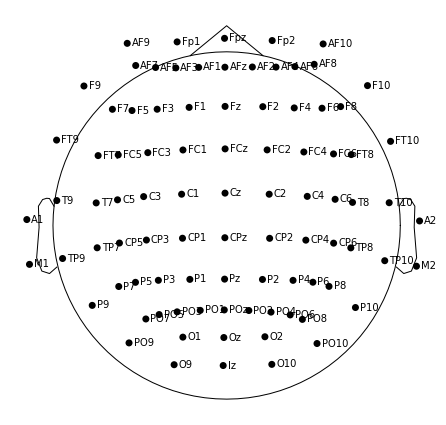

4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


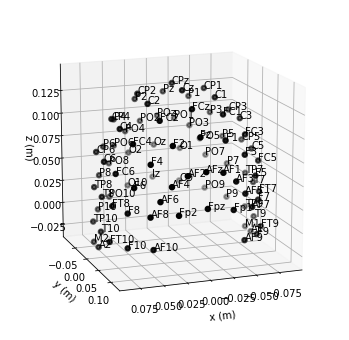

In [20]:
# Import the standard 10-20 montage for use in the mne data set. Code taken from online MNE tutorial
s1020 = mne.channels.make_standard_montage('standard_1020')
print(s1020)

s1020.plot()  # 2D
fig = s1020.plot(kind='3d', show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

{'F3': array([-0.04908182,  0.06114545,  0.04584545]), 'F4': array([0.04908182, 0.06114545, 0.04584545]), 'O1': array([-0.02809091, -0.08646364,  0.        ]), 'O2': array([ 0.02809091, -0.08646364,  0.        ]), 'F7': array([-0.07354545,  0.05343636,  0.        ]), 'F8': array([0.07354545, 0.05343636, 0.        ]), 'T7': array([-0.09090909,  0.        ,  0.        ]), 'T8': array([0.09090909, 0.        , 0.        ]), 'P7': array([-7.35454545e-02, -5.34363636e-02, -9.09090909e-06]), 'P8': array([ 7.35454545e-02, -5.34363636e-02, -9.09090909e-06]), 'FC5': array([-0.07917273,  0.03066364,  0.03226364]), 'FC6': array([0.07917273, 0.03066364, 0.03226364]), 'AF3': array([-0.03636364,  0.08181818,  0.03909091]), 'AF4': array([0.03636364, 0.08181818, 0.03909091])}


<ipython-input-21-a2732b1b990b>:9: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  montage.plot()


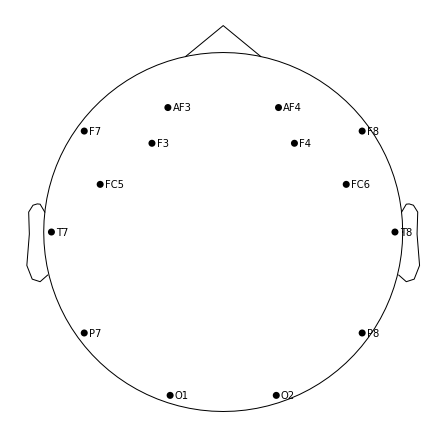

<ipython-input-21-a2732b1b990b>:10: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  fig = montage.plot(kind='3d', show=False)  # 3D


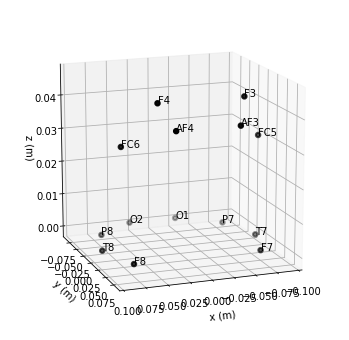

In [21]:
# Load in custom montage for visualisation purposes, not for use in datasets. Code taken from online MNE tutorial.
df = pd.read_csv('/content/drive/MyDrive/Bath/Dissertation/Analysis/channels_positional_Emotiv14.txt')
ch_names = df.name.to_list()

pos = df[['x','y','z']].values/11 # Scale down to size
dig_ch_pos = dict(zip(ch_names,pos))
print(dig_ch_pos)
montage = mne.channels.make_dig_montage(ch_pos=dig_ch_pos)
montage.plot()
fig = montage.plot(kind='3d', show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

# MNE work stimuli data

In [22]:
stimuli_mne = stimuli.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label']) # remove unwanted columns and keep channel data for loading into the mne dataset.

In [23]:
# Load data into mne RawArray format, with montage set to standard 10-20 system...

sfreq = 256
ch_names = list(stimuli_mne.columns)
print(ch_names)
info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = 'eeg')
raw_stimuli = mne.io.RawArray(stimuli_mne[ch_names].transpose(), info)
raw_stimuli.set_montage(s1020)
raw_stimuli.info
#raw_stimuli.plot()
raw_stimuli

['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
Creating RawArray with float64 data, n_channels=14, n_times=66560
    Range : 0 ... 66559 =      0.000 ...   259.996 secs
Ready.


<RawArray | 14 x 66560 (260.0 s), ~7.1 MB, data loaded>

In [24]:
# Create an events array and dictionary for the loading of the data into an mne Epochs format (In the case of the stimuli data)...

events_stimuli = mne.make_fixed_length_events(raw_stimuli, start=0, stop=4504, duration=2)
events_dict = {'Visual' : 1,
               'Audio' : 2,
               'Text' : 3,
               'None': 4}
events_stimuli.shape
events_stimuli[np.array(modes_of_stimuli_stimstage) == 'audio', 2] = np.array([2 for i in range((np.array(modes_of_stimuli_stimstage) == 'audio').sum())])
events_stimuli[np.array(modes_of_stimuli_stimstage) == 'text', 2] = np.array([3 for i in range((np.array(modes_of_stimuli_stimstage) == 'text').sum())])
events_stimuli[np.array(modes_of_stimuli_stimstage) == 'None', 2] = np.array([4 for i in range((np.array(modes_of_stimuli_stimstage) == 'None').sum())])
events_stimuli[:50]

array([[    0,     0,     2],
       [  512,     0,     1],
       [ 1024,     0,     1],
       [ 1536,     0,     2],
       [ 2048,     0,     3],
       [ 2560,     0,     3],
       [ 3072,     0,     4],
       [ 3584,     0,     3],
       [ 4096,     0,     2],
       [ 4608,     0,     1],
       [ 5120,     0,     3],
       [ 5632,     0,     3],
       [ 6144,     0,     3],
       [ 6656,     0,     1],
       [ 7168,     0,     1],
       [ 7680,     0,     1],
       [ 8192,     0,     4],
       [ 8704,     0,     1],
       [ 9216,     0,     1],
       [ 9728,     0,     2],
       [10240,     0,     1],
       [10752,     0,     2],
       [11264,     0,     1],
       [11776,     0,     1],
       [12288,     0,     3],
       [12800,     0,     3],
       [13312,     0,     2],
       [13824,     0,     4],
       [14336,     0,     2],
       [14848,     0,     1],
       [15360,     0,     2],
       [15872,     0,     2],
       [16384,     0,     3],
       [16

Not setting metadata
130 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 130 events and 513 original time points ...
1 bad epochs dropped
Using data from preloaded Raw for 129 events and 513 original time points ...
Using matplotlib as 2D backend.
Using data from preloaded Raw for 10 events and 513 original time points ...


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


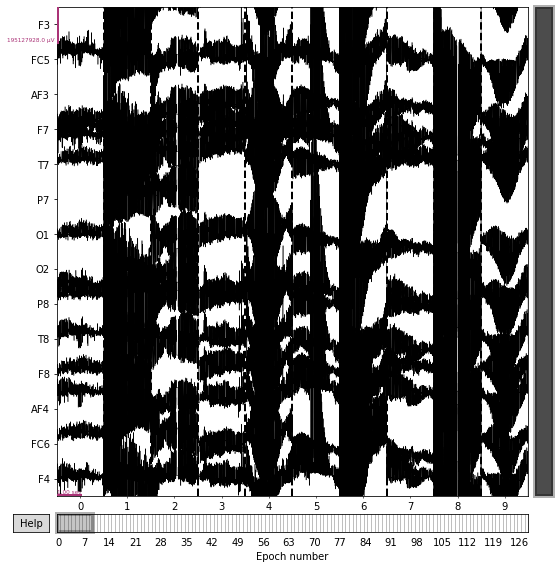

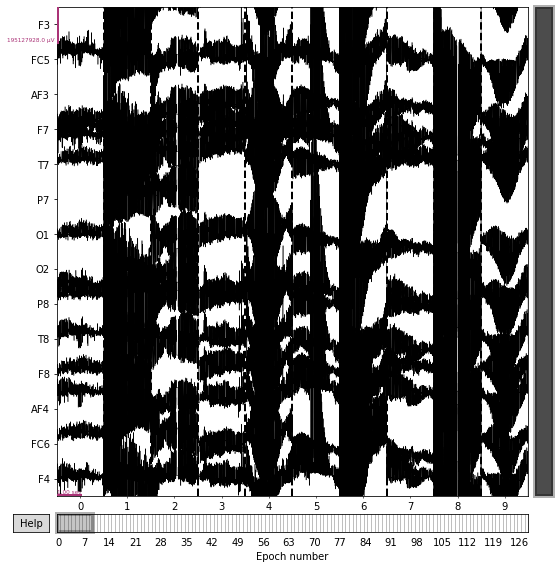

In [25]:
#Load the stimuli data into mne Epochs format...

stimuli_epoched = mne.Epochs(raw_stimuli, tmin=0, tmax = 2, baseline=(0, 0), events = events_stimuli, event_id=events_dict)
stimuli_epoched.plot(events = events_stimuli, n_epochs=10, scalings = 'auto')

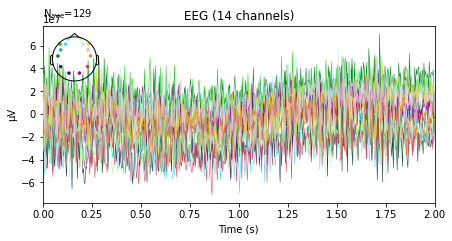

In [26]:
# Evoked response throughout all modes of stimuli...
ER_all = stimuli_epoched.average()
fig2 = ER_all.plot(spatial_colors=True)

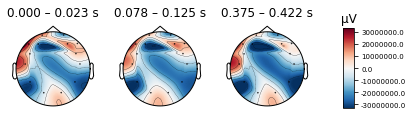

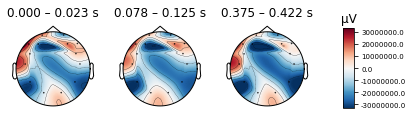

In [27]:
ER_all.plot_topomap(times=[0, 0.1, 0.4], average=0.05)

No projector specified for this dataset. Please consider the method self.add_proj.


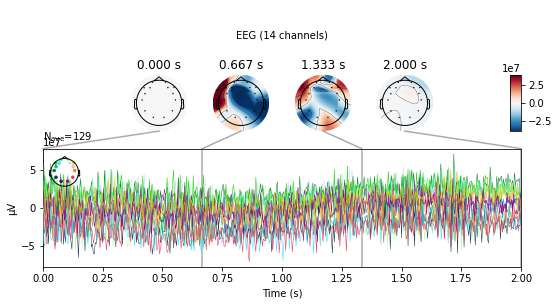

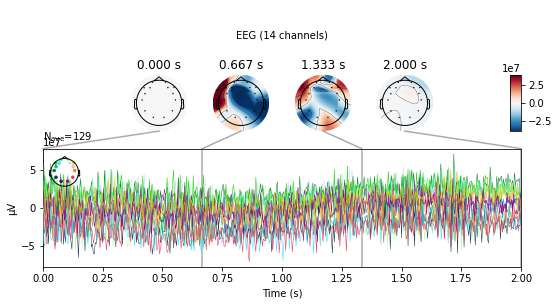

In [28]:
ER_all.plot_joint(times='auto')

In [29]:
# Find the average for each mode of stimuli...
average_aud = stimuli_epoched['Audio'].average()
average_text = stimuli_epoched['Text'].average()
average_viz = stimuli_epoched['Visual'].average()


No projector specified for this dataset. Please consider the method self.add_proj.


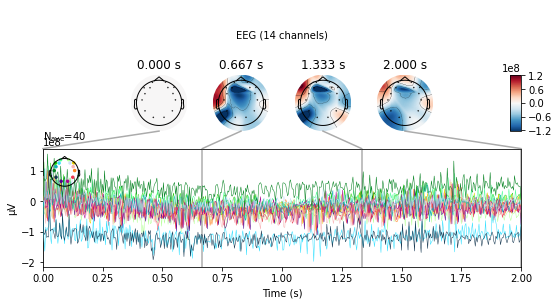

No projector specified for this dataset. Please consider the method self.add_proj.


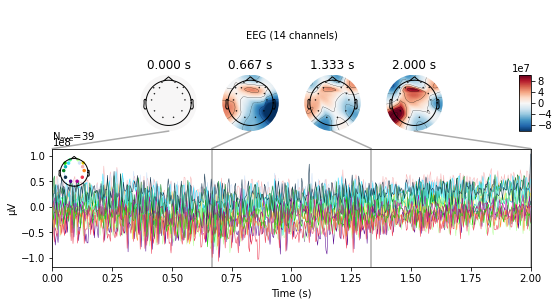

No projector specified for this dataset. Please consider the method self.add_proj.


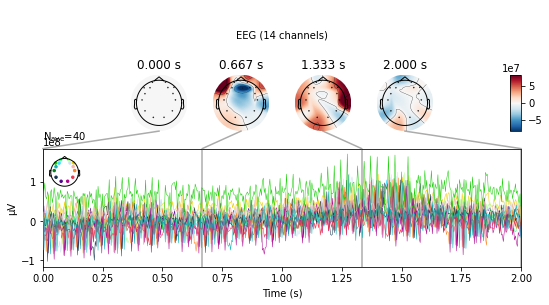

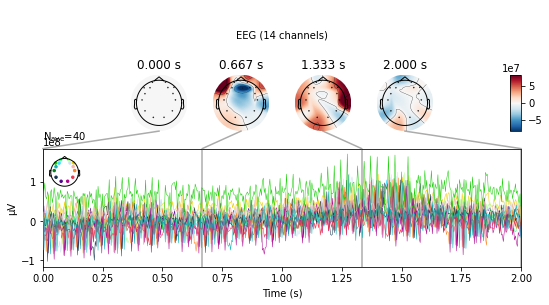

In [30]:
# Joint plot of average repsonse for 14 channels with topography overplot...
# For Audio, Visual, and text...
average_aud.plot_joint(times='auto')
average_text.plot_joint(times='auto')
average_viz.plot_joint(times='auto')

In [31]:
# Creation of independant lists for different brain regions of interest...
occipital = ['O1', 'O2']
temporal = ['T7', 'T8']
broca = ['F7']
ch_names


['F3',
 'FC5',
 'AF3',
 'F7',
 'T7',
 'P7',
 'O1',
 'O2',
 'P8',
 'T8',
 'F8',
 'AF4',
 'FC6',
 'F4']

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


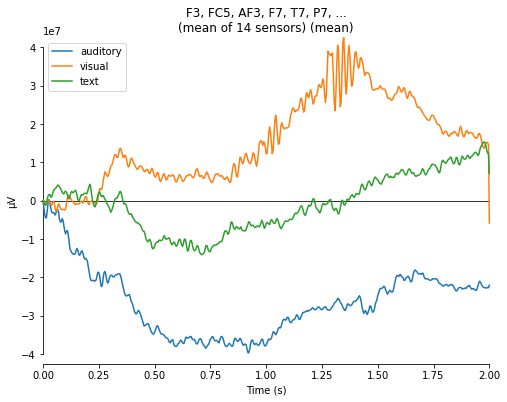

[<Figure size 576x432 with 1 Axes>]

In [32]:
# Plot of evoked responses for all channels averaged ...
evokeds = dict(auditory=average_aud, visual=average_viz, text=average_text)
picks = [ch_names[n] for n in range(0, 14)]
mne.viz.plot_compare_evokeds(evokeds, picks, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


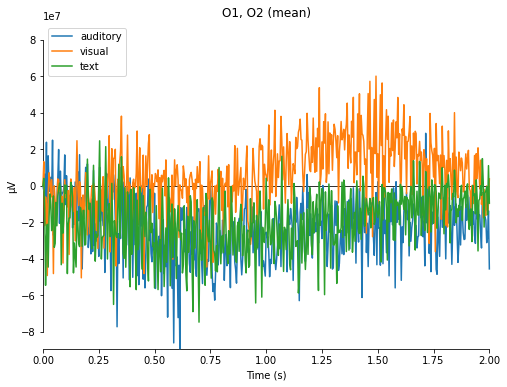

[<Figure size 576x432 with 1 Axes>]

In [33]:
# Plot of evoked responses for Occipital regions averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = occipital, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


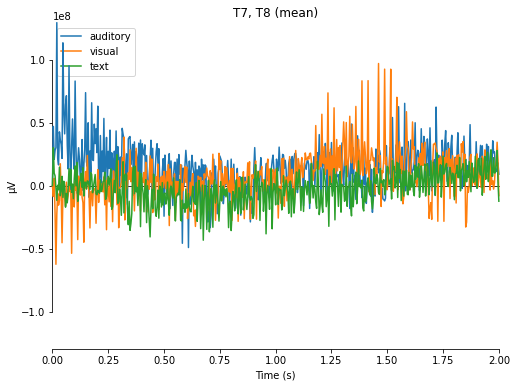

[<Figure size 576x432 with 1 Axes>]

In [34]:
# Plot of evoked responses for regions averaged...
mne.viz.plot_compare_evokeds(evokeds, picks = temporal, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<ipython-input-35-2a2acca60a80>:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')


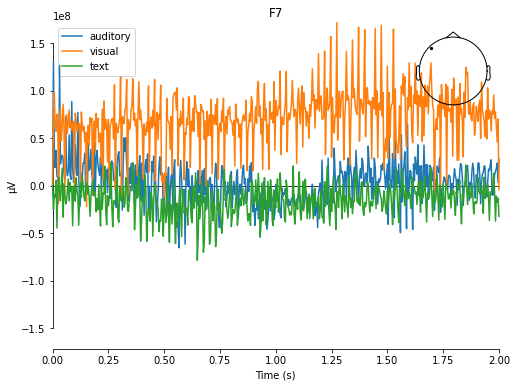

[<Figure size 576x432 with 2 Axes>]

In [35]:
# Plot of evoked responses for brocas area averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')

# MNE work speaking data

In [36]:
speaking_mne = speaking.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label', 'Time Index'])  # remove unwanted columns and keep channel data for loading into the mne dataset.

In [37]:
# Load data into mne RawArray format, with montage set to standard 10-20 system...

sfreq = 256
ch_names = list(speaking_mne.columns)
print(ch_names)
info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = 'eeg')
raw_speaking = mne.io.RawArray(speaking_mne[ch_names].transpose(), info)
raw_speaking.set_montage(s1020)
raw_speaking.info
#raw_stimuli.plot()
raw_speaking

['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
Creating RawArray with float64 data, n_channels=14, n_times=665600
    Range : 0 ... 665599 =      0.000 ...  2599.996 secs
Ready.


<RawArray | 14 x 665600 (2600.0 s), ~71.1 MB, data loaded>

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


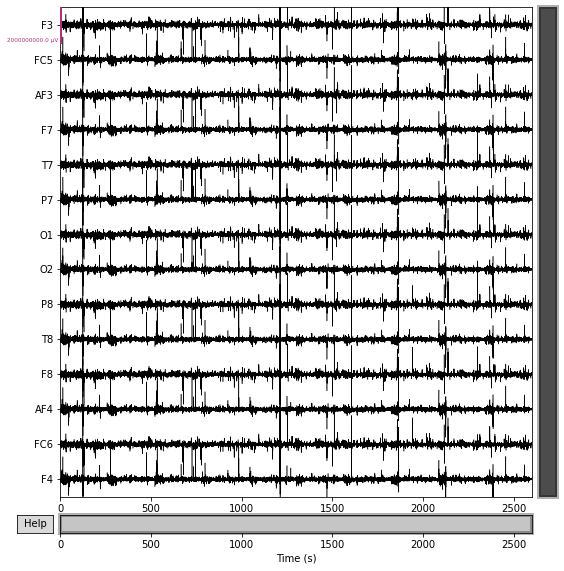

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


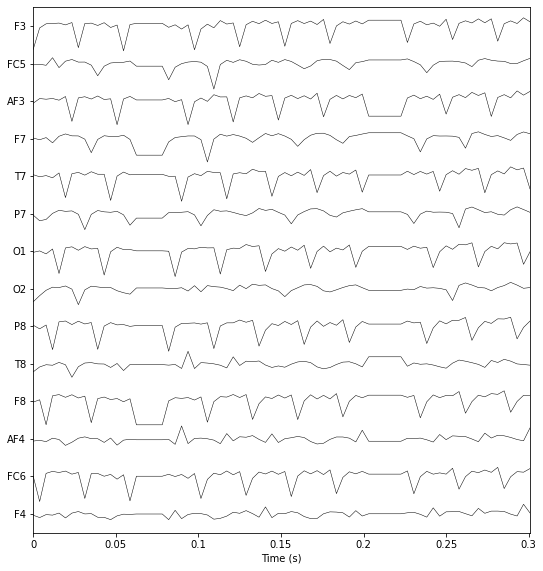

In [51]:
raw_speaking.plot(duration = 3000, scalings = 1000)

FVP = mne.viz.plot_raw(raw_speaking, duration = 0.3, scalings = 100, title='3 Seconds raw speaking data across all 14 channels', show_scrollbars=False, show_scalebars=False)

In [38]:
# Create an events array and dictionary for the loading of the data into an mne Epochs format (In the case of the speaking data)...

events_speaking = mne.make_fixed_length_events(raw_speaking, start=0, stop=4504, duration=2)
events_dict = {'Visual' : 1,
               'Audio' : 2,
               'Text' : 3,
               'None': 4}
events_speaking.shape
events_speaking[np.array(modes_of_stimuli) == 'audio', 2] = np.array([2 for i in range((np.array(modes_of_stimuli) == 'audio').sum())])
events_speaking[np.array(modes_of_stimuli) == 'text', 2] = np.array([3 for i in range((np.array(modes_of_stimuli) == 'text').sum())])
events_speaking[np.array(modes_of_stimuli) == 'None', 2] = np.array([4 for i in range((np.array(modes_of_stimuli) == 'None').sum())])
#events_stimuli[:50]


Not setting metadata
1300 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1300 events and 512 original time points ...
    Rejecting  epoch based on EEG : ['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'AF4', 'F4']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'AF4', 'F4']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'AF4', 'F4']
    Rejecting  epoch based on EEG : ['F3', 'AF3', 'T7', 'O1', 'P8', 'F8', 'FC6']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'F4']
    Rejecting  epoch based on EEG : ['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
    Rejecting  epoch based on EEG : ['FC6']
    Rejecting  epoch based on EEG : ['O1', 'P8', 'F8', 'FC6']
    Rejecting  epoch based on EEG : ['FC5', 'F7'

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


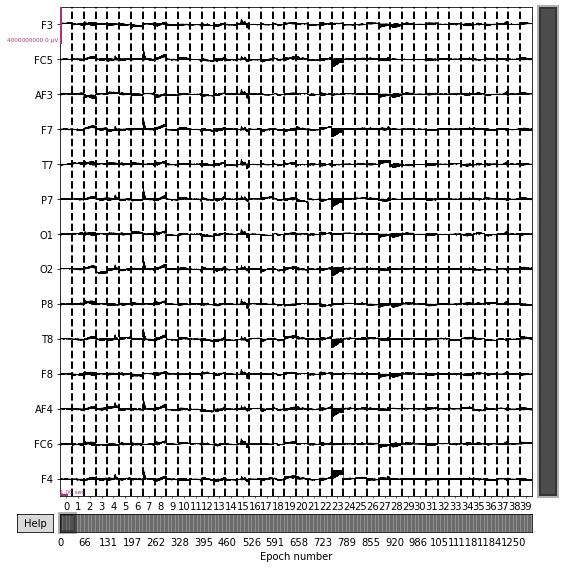

    Using multitaper spectrum estimation with 7 DPSS windows


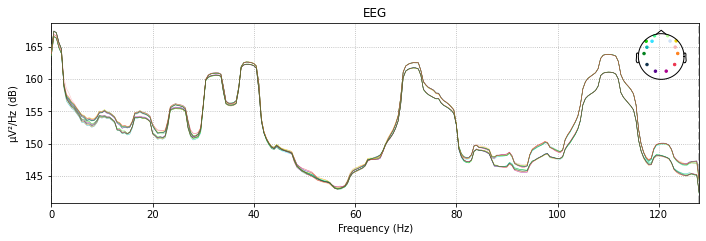

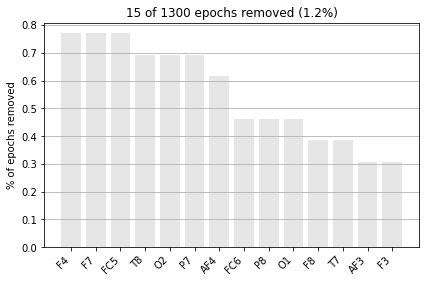

No projector specified for this dataset. Please consider the method self.add_proj.


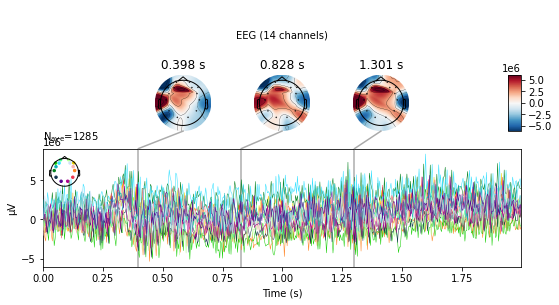

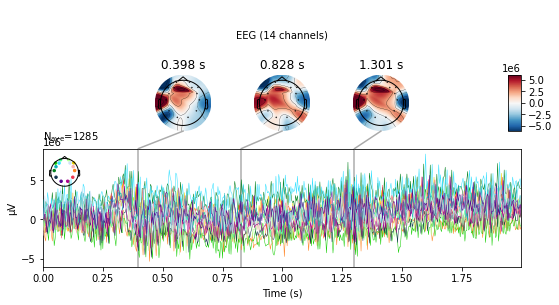

In [39]:
reject_criteria = {'eeg' : 2000}
speaking_epoched = mne.Epochs(raw_speaking, tmin=0, tmax = 2-1/256, baseline=(0, 0), events = events_speaking, event_id=events_dict,
                              reject=reject_criteria,
                              reject_by_annotation=False, preload = True)

speaking_epoched.plot(events = events_speaking, n_epochs=40, scalings = 2000)
speaking_epoched.plot_psd()
speaking_epoched.plot_drop_log()
speaking_epoched.average().plot_joint()

    Using multitaper spectrum estimation with 7 DPSS windows


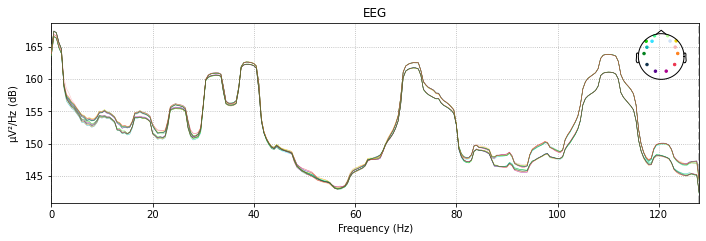

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 17990 out of 17990 | elapsed:    3.1s finished


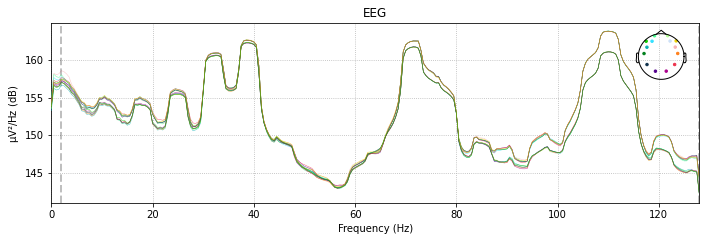

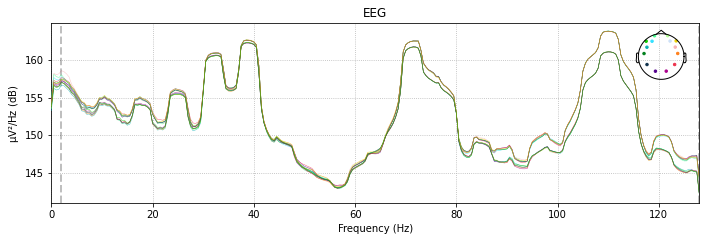

In [40]:
speaking_epoched.plot_psd()
speaking_epoched_filt = speaking_epoched.copy().filter(l_freq = 2, h_freq = None)
speaking_epoched_filt.plot_psd()

In [41]:
speaking_epoched_filt

Number of events,1285
Events,Audio: 396None: 98Text: 398Visual: 393
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


Audio preprocessing...

<Epochs |  396 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~21.7 MB, data loaded,
 'Audio': 396>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


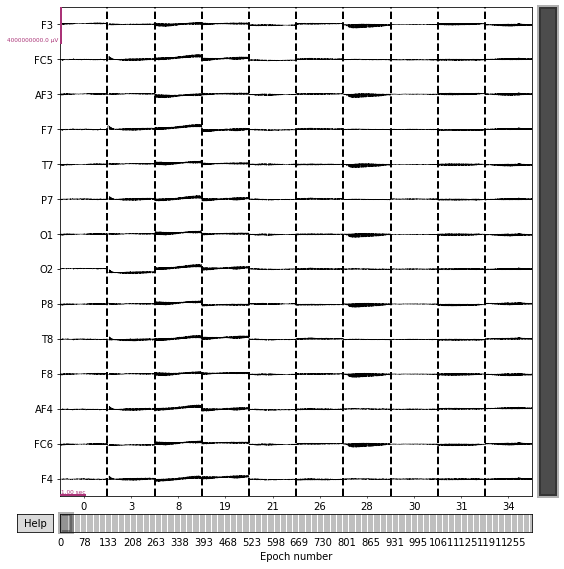

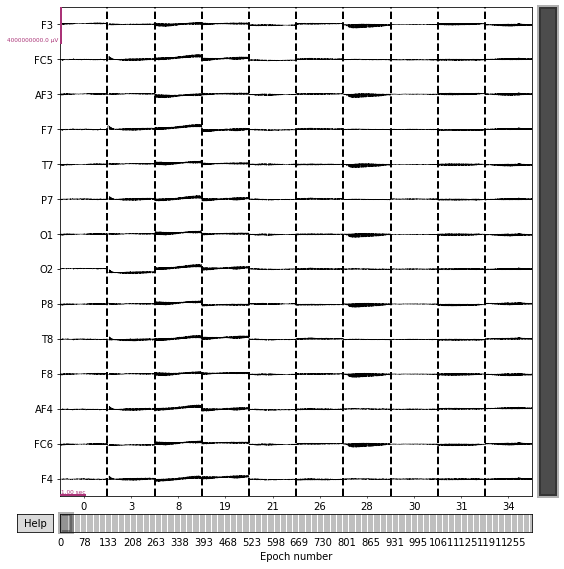

In [42]:
print(speaking_epoched['Audio'])
audio_mne = speaking_epoched['Audio']
audio_mne.plot(n_epochs = 10, scalings = 2000)

    Using multitaper spectrum estimation with 7 DPSS windows


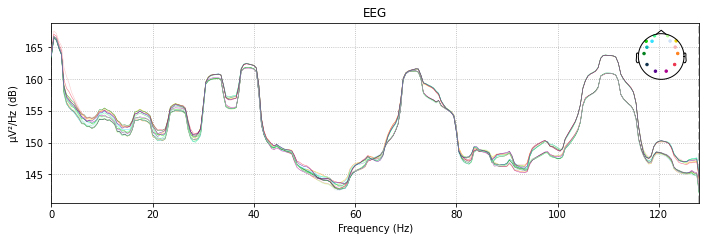

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 5544 out of 5544 | elapsed:    0.9s finished


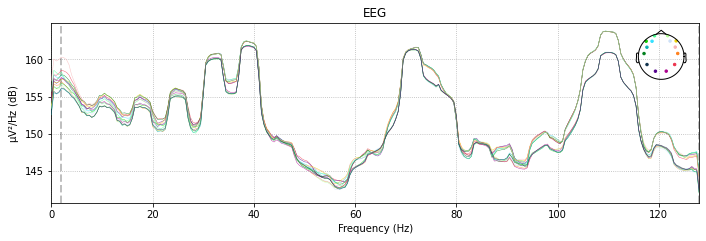

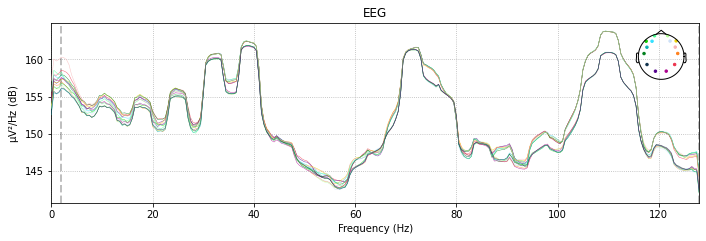

In [43]:
audio_mne.plot_psd()
audio_mne_filt = audio_mne.copy().filter(l_freq = 2, h_freq = None)
audio_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-44-71ccd4847f8c>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_aud.fit(audio_mne_filt)


Fitting ICA took 3.6s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated


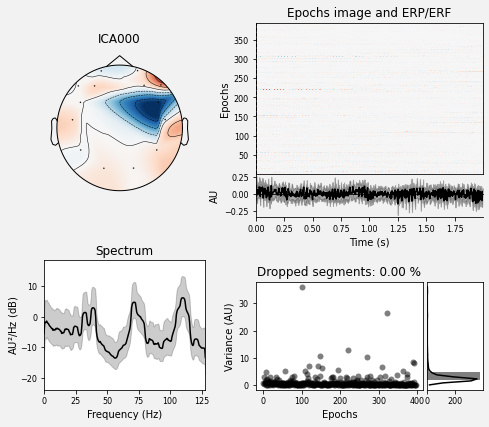

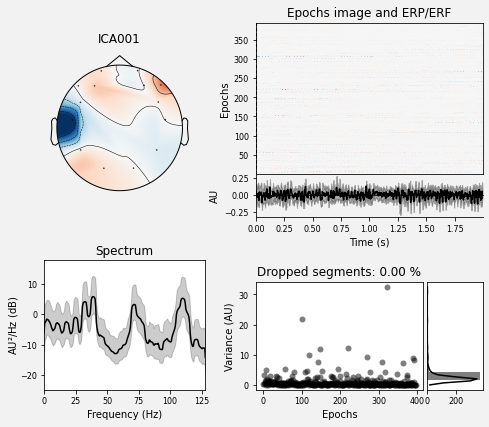

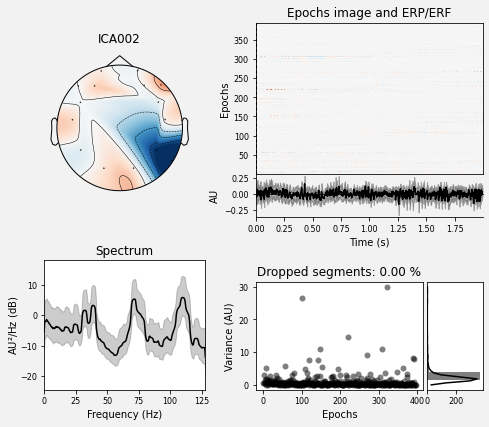

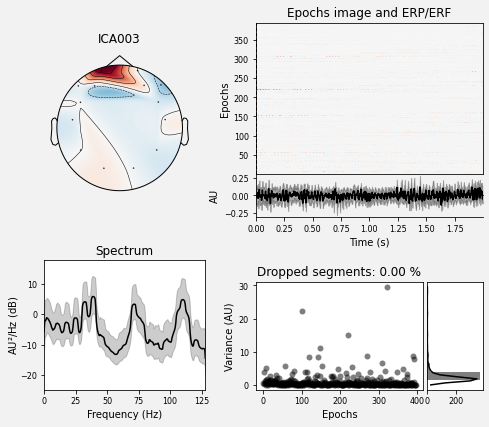

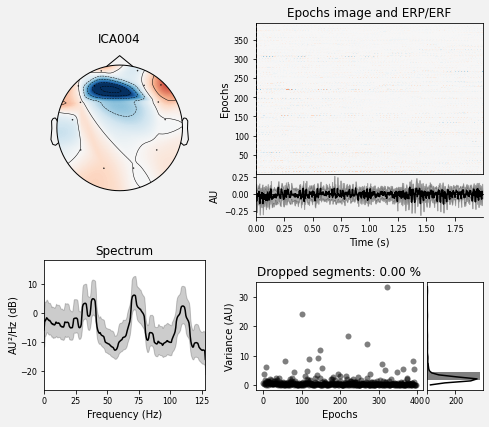

Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


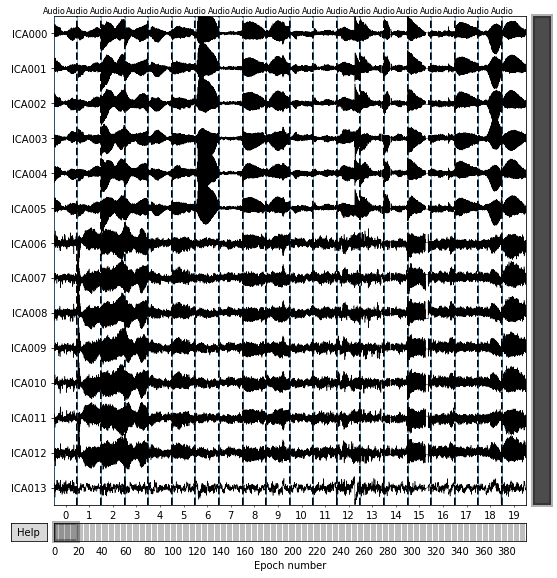

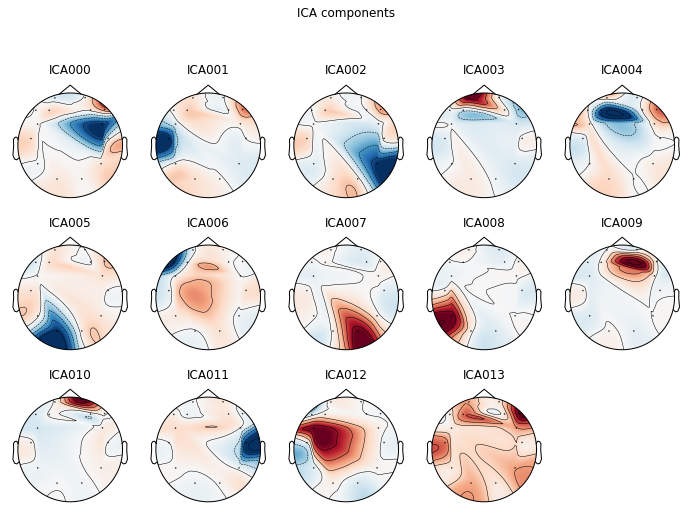

[<MNEFigure size 702x526.68 with 14 Axes>]

In [44]:
ica_aud = mne.preprocessing.ICA()
ica_aud.fit(audio_mne_filt)
ica_aud.plot_properties(audio_mne_filt)
ica_aud.plot_sources(audio_mne_filt)
ica_aud.plot_components()

In [45]:
ica_aud.exclude = [0, 1]
audio_mne_processed = audio_mne.copy()
ica_aud.apply(audio_mne_processed)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-45-76f6f3aeda49>:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_aud.apply(audio_mne_processed)


Number of events,396
Events,Audio: 396
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


Text processing...

<Epochs |  398 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~21.8 MB, data loaded,
 'Text': 398>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


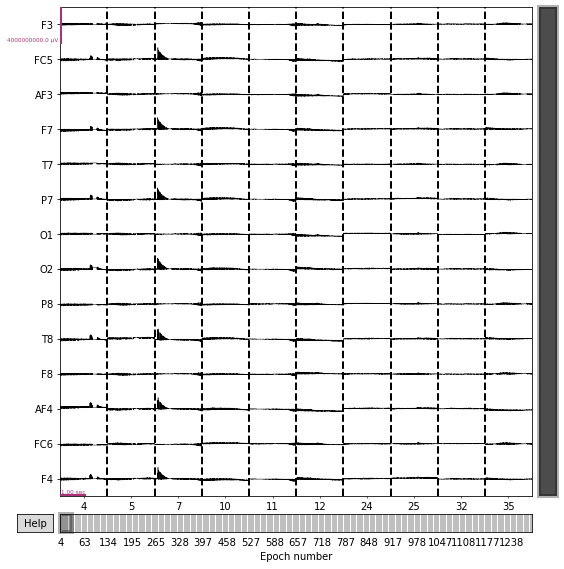

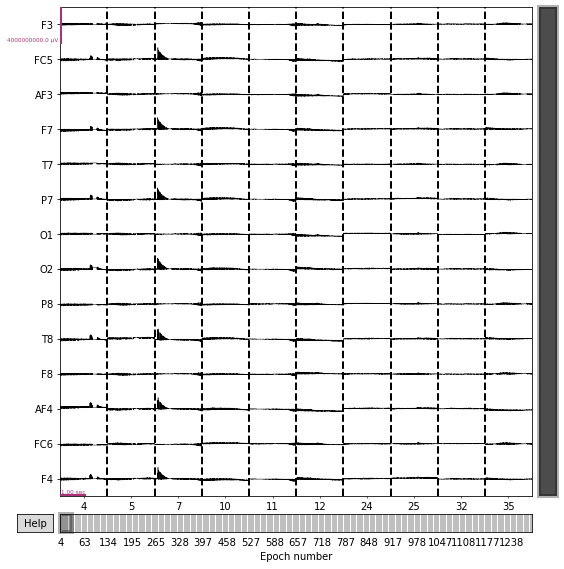

In [46]:
print(speaking_epoched['Text'])
text_mne = speaking_epoched['Text']
text_mne.plot(n_epochs = 10, scalings = 2000)

    Using multitaper spectrum estimation with 7 DPSS windows


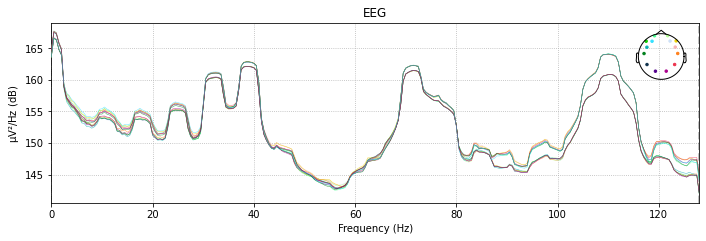

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 5572 out of 5572 | elapsed:    0.9s finished


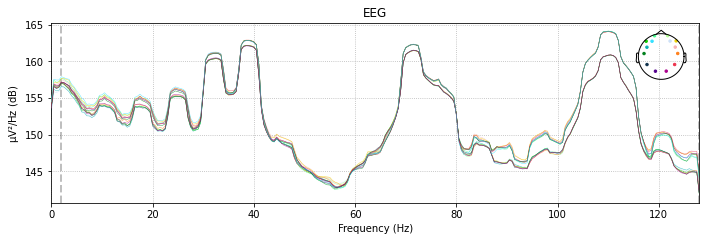

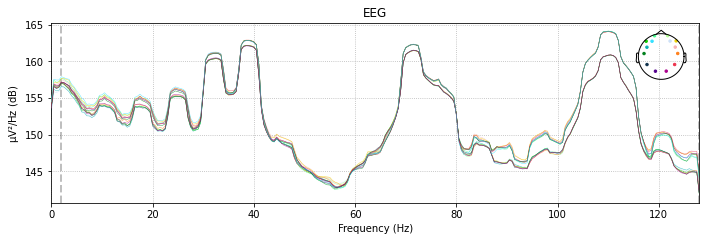

In [47]:
text_mne.plot_psd()
text_mne_filt = text_mne.copy().filter(l_freq = 2, h_freq = None)
text_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-48-c4db4583a401>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_text.fit(text_mne_filt)


Fitting ICA took 2.8s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated


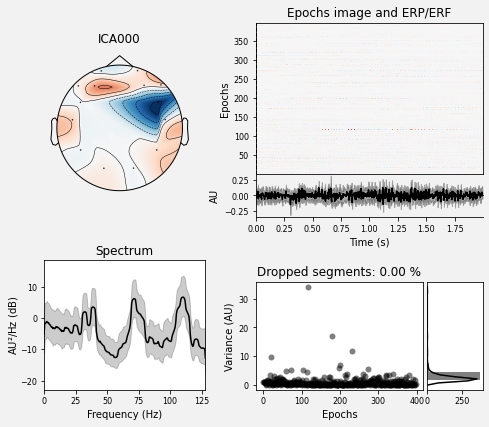

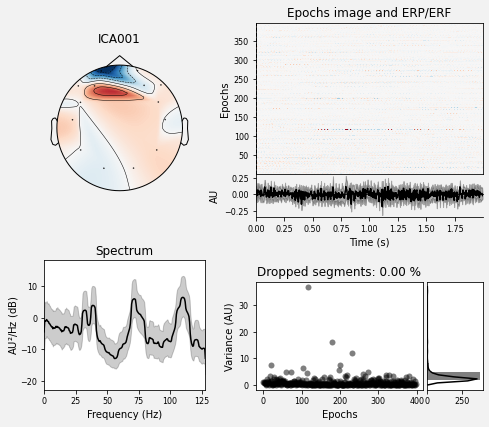

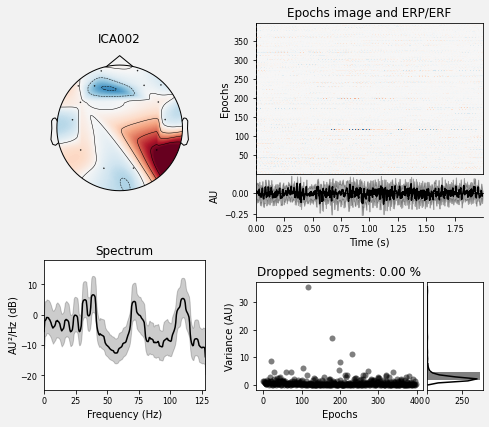

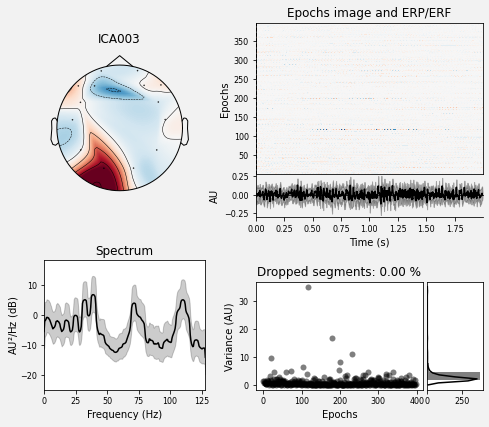

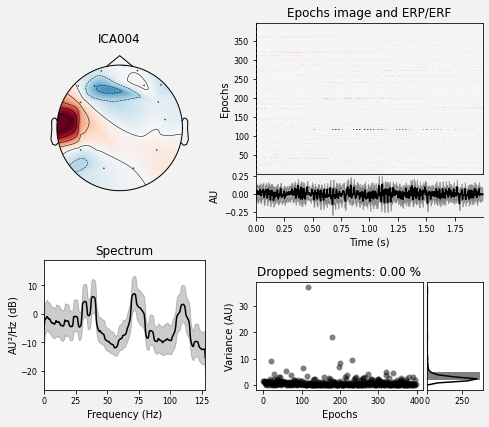

Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


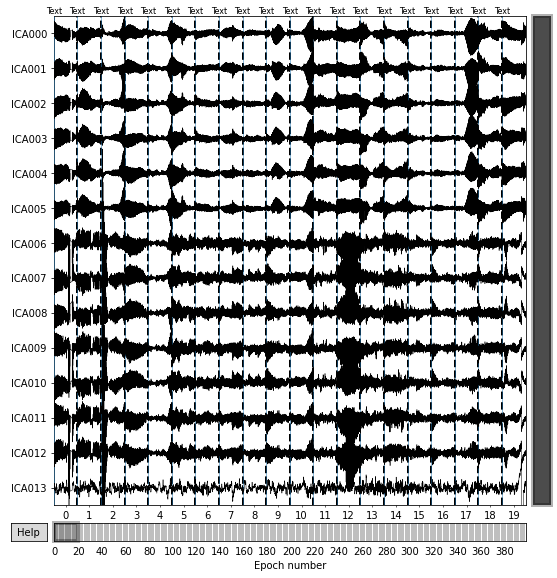

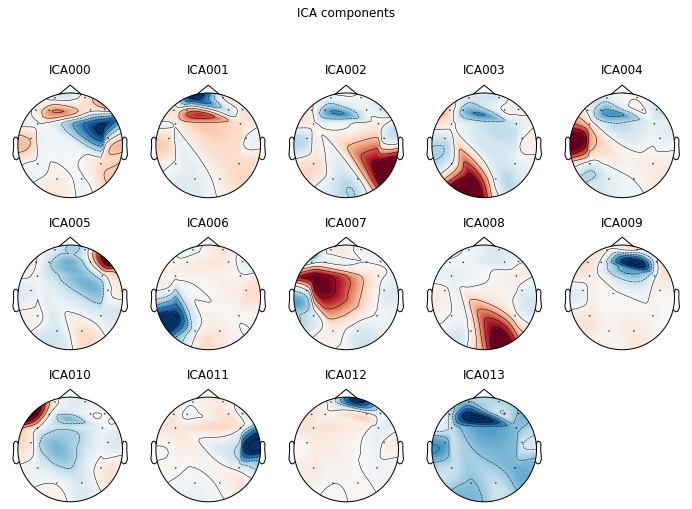

[<MNEFigure size 702x526.68 with 14 Axes>]

In [48]:
ica_text = mne.preprocessing.ICA()
ica_text.fit(text_mne_filt)
ica_text.plot_properties(text_mne_filt)
ica_text.plot_sources(text_mne_filt)
ica_text.plot_components()

In [49]:
ica_text.exclude = [0, 1]
text_mne_processed = text_mne.copy()
ica_text.apply(text_mne_processed)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-49-63f5548fc231>:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_text.apply(text_mne_processed)


Number of events,398
Events,Text: 398
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


Visual processing...

<Epochs |  393 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~21.5 MB, data loaded,
 'Visual': 393>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


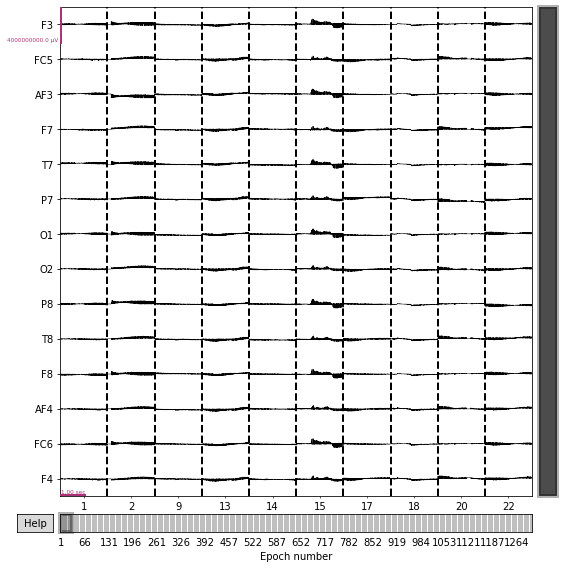

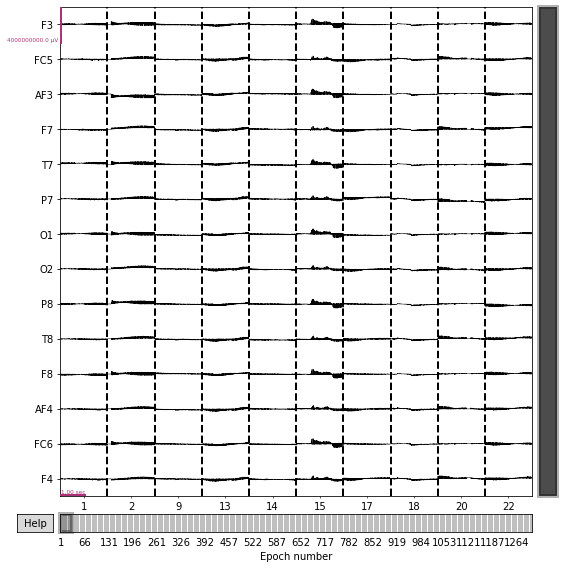

In [50]:
print(speaking_epoched['Visual'])
visual_mne = speaking_epoched['Visual']
visual_mne.plot(n_epochs = 10, scalings = 2000)

    Using multitaper spectrum estimation with 7 DPSS windows


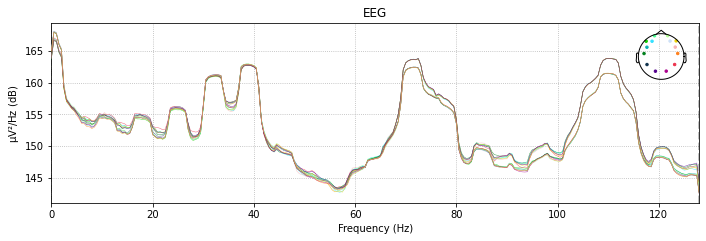

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 5502 out of 5502 | elapsed:    0.9s finished


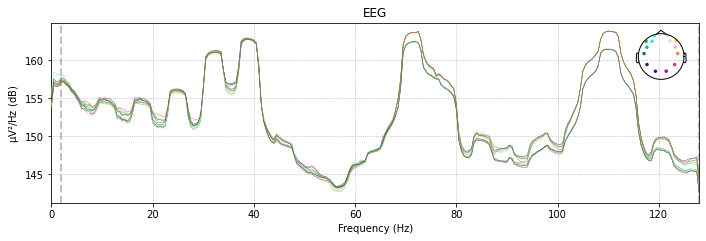

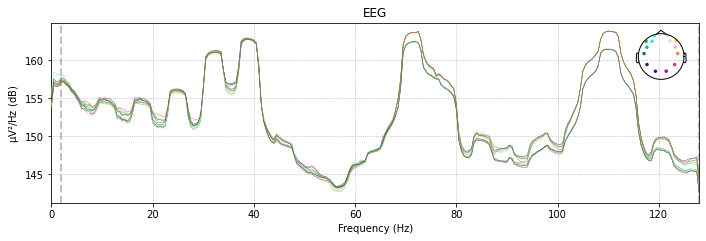

In [51]:
visual_mne.plot_psd()
visual_mne_filt = visual_mne.copy().filter(l_freq = 2, h_freq = None)
visual_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-52-bc8ecefecdcc>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_viz.fit(visual_mne_filt)


Fitting ICA took 6.4s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated


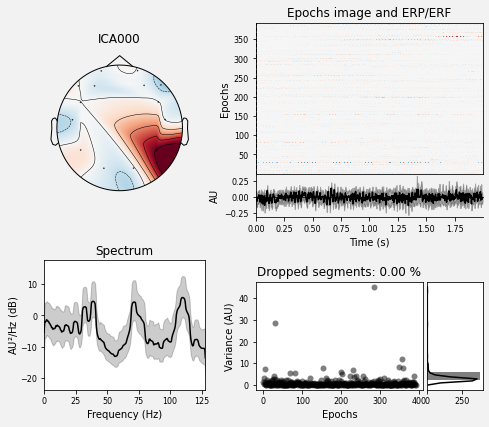

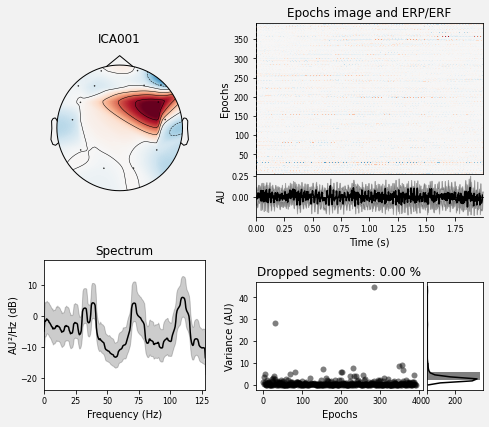

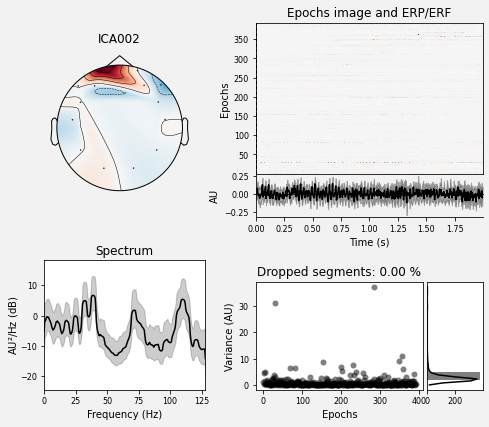

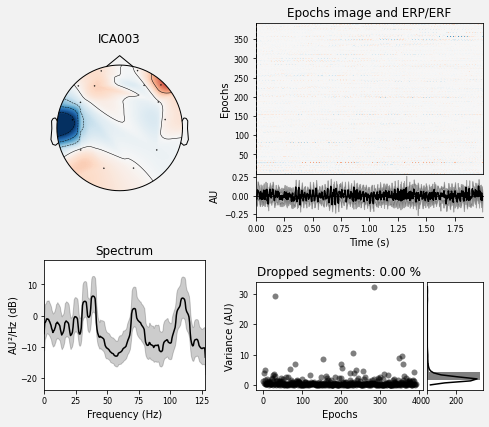

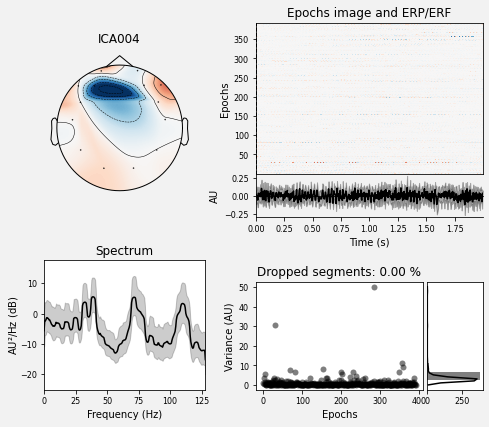

Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


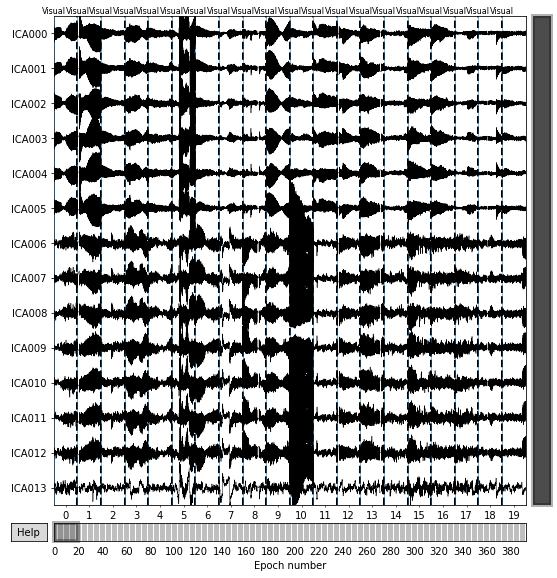

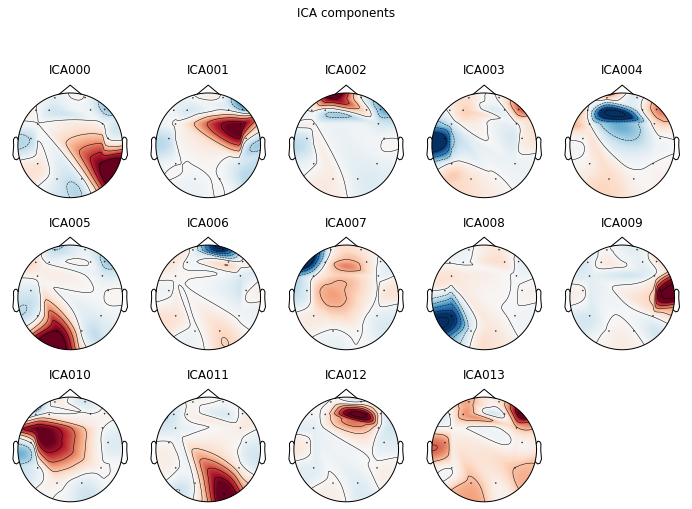

[<MNEFigure size 702x526.68 with 14 Axes>]

In [52]:
ica_viz = mne.preprocessing.ICA()
ica_viz.fit(visual_mne_filt)
ica_viz.plot_properties(visual_mne_filt)
ica_viz.plot_sources(visual_mne_filt)
ica_viz.plot_components()

In [53]:
ica_viz.exclude = [0, 1]
visual_mne_processed = visual_mne.copy()
ica_viz.apply(visual_mne_processed)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-53-680031762bf5>:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_viz.apply(visual_mne_processed)


Number of events,393
Events,Visual: 393
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


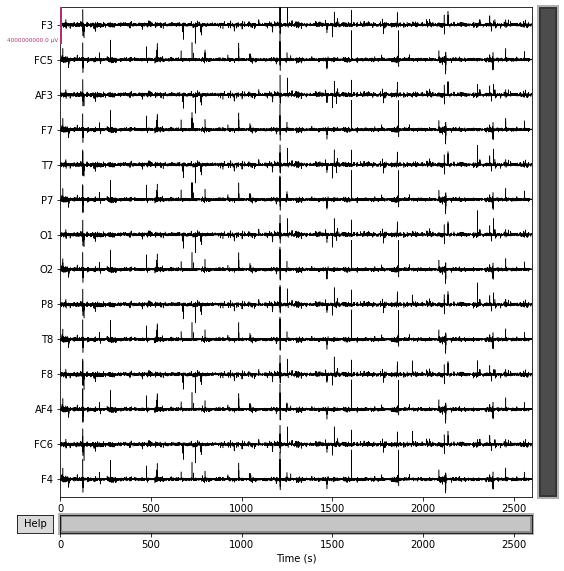

Effective window size : 8.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


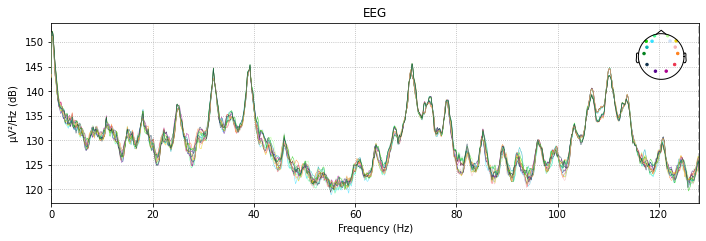

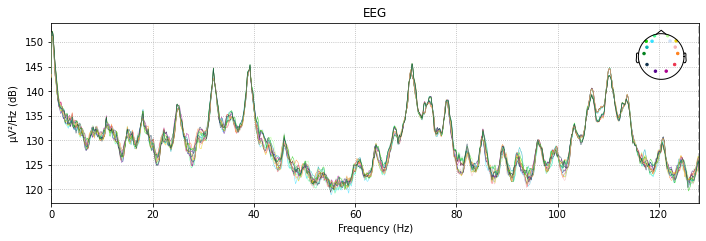

In [54]:
# plot over all spekaing data, and a frequency plot over a 8 second window.
raw_speaking.plot(start = 0, duration = 3000, scalings = 2000)
raw_speaking.plot_psd(fmax=128)


Effective window size : 8.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


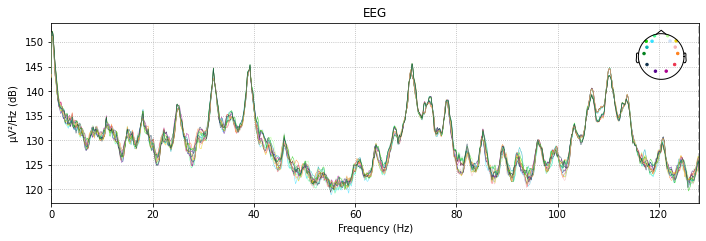

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1.1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 110.00 Hz
- Upper transition bandwidth: 18.00 Hz (-6 dB cutoff frequency: 119.00 Hz)
- Filter length: 845 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Setting up band-stop filter from 70 - 78 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 70.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 70.25 Hz)
- Upper passband edge: 77.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 77.75 Hz)
- Filter length: 1691 samples (6.605 sec)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1691 samples (6.605 sec)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Effective window size : 8.000 (s)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


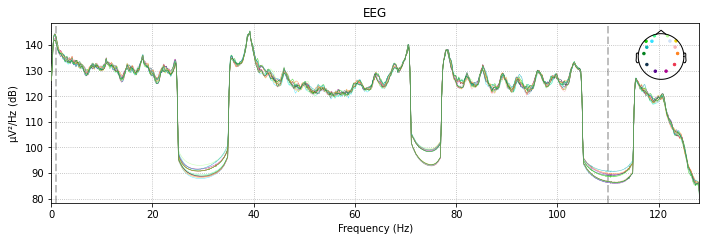

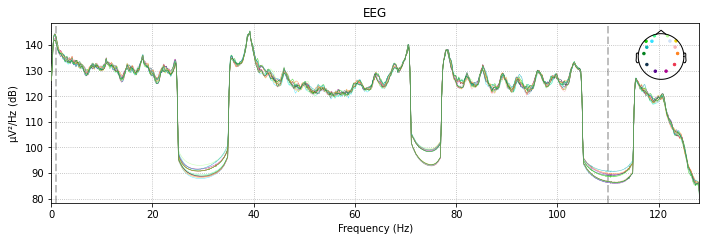

In [55]:
# High pass, Low pass and notch filtering applied to the data...

raw_speaking.plot_psd(fmax=128)

low_cut = 1
hi_cut  = 110
freqs = (74, 110)

raw_speaking_filt = raw_speaking.copy().filter(l_freq=low_cut, h_freq=hi_cut)
raw_speaking_filt = raw_speaking_filt.copy().notch_filter(freqs =74, notch_widths = 6).notch_filter(freqs =(30, 110), notch_widths = 10)
raw_speaking_filt.plot_psd(fmax=128)


Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components
Fitting ICA took 14.3s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated


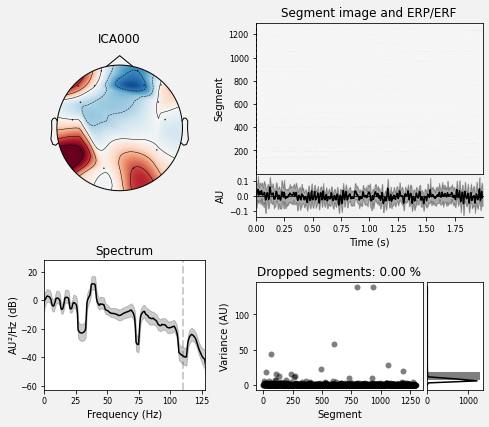

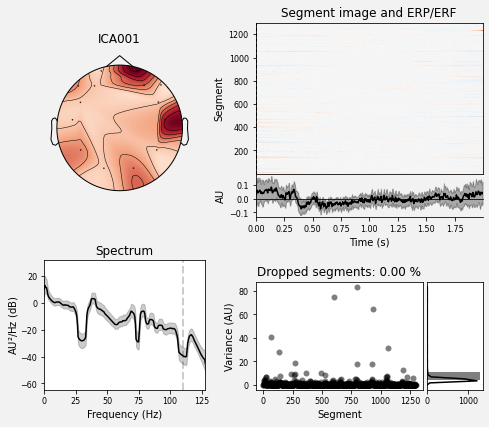

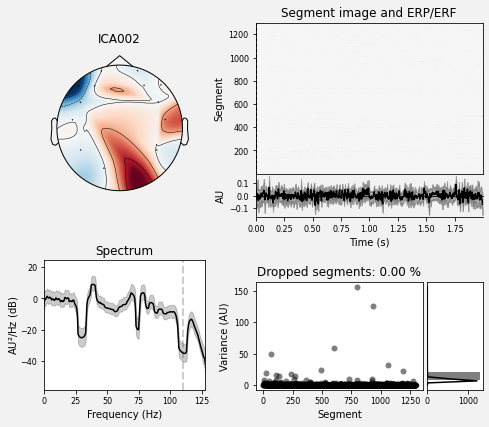

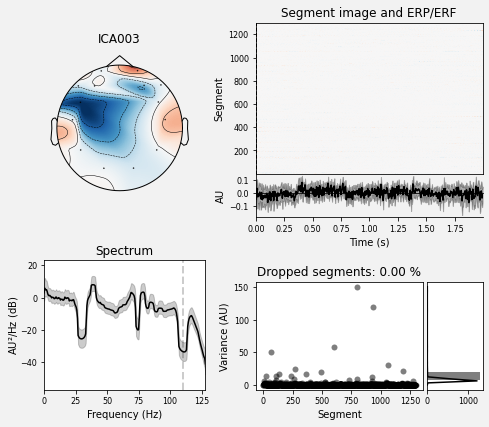

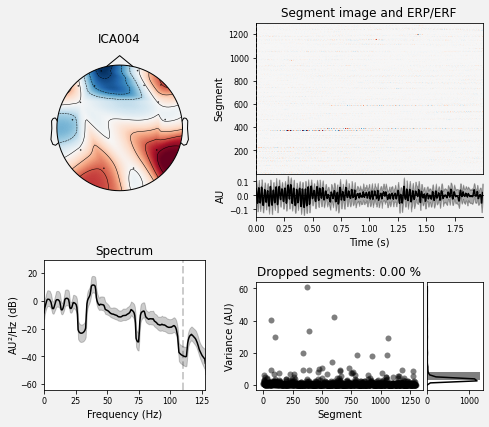

Creating RawArray with float64 data, n_channels=14, n_times=665600
    Range : 0 ... 665599 =      0.000 ...  2599.996 secs
Ready.


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


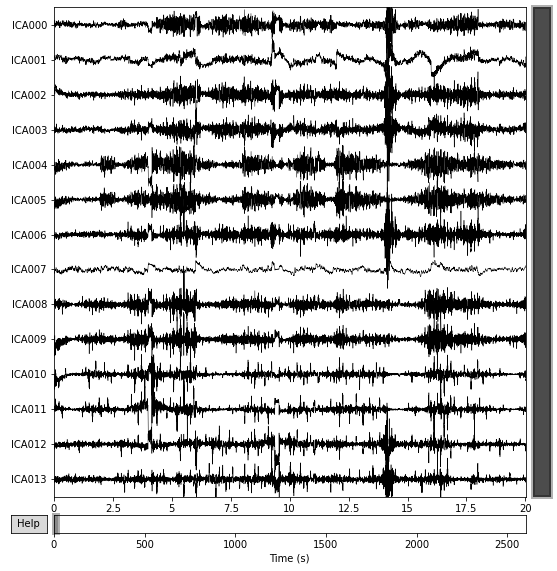

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components


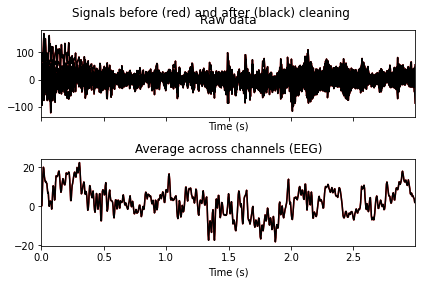

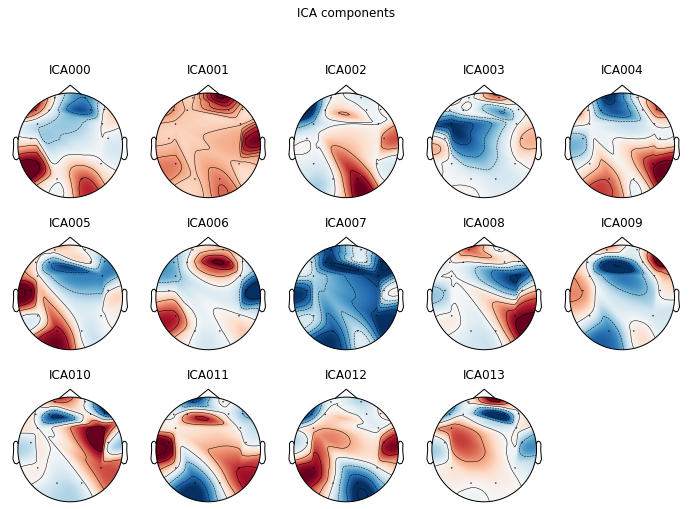

[<MNEFigure size 702x526.68 with 14 Axes>]

In [56]:
# Fitting of ICA and plot of various graphs for analysis...

ica = mne.preprocessing.ICA()
ica.fit(raw_speaking_filt)
ica.plot_properties(raw_speaking_filt)
ica.plot_sources(raw_speaking_filt)
ica.plot_overlay(raw_speaking_filt)
ica.plot_components()


In [57]:
# input into the ICA class which components to exclude, then apply the transformation to the raw unfiltered data...
ica.exclude = [0, 1]
speaking_processed_mne = raw_speaking.copy()
ica.apply(speaking_processed_mne)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<RawArray | 14 x 665600 (2600.0 s), ~71.1 MB, data loaded>

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


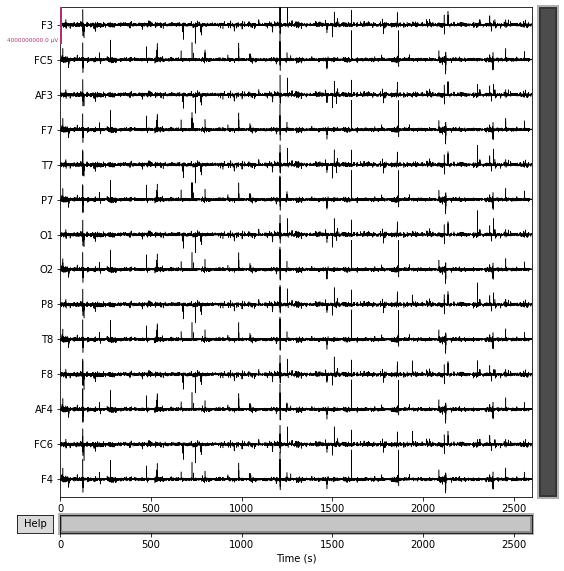

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


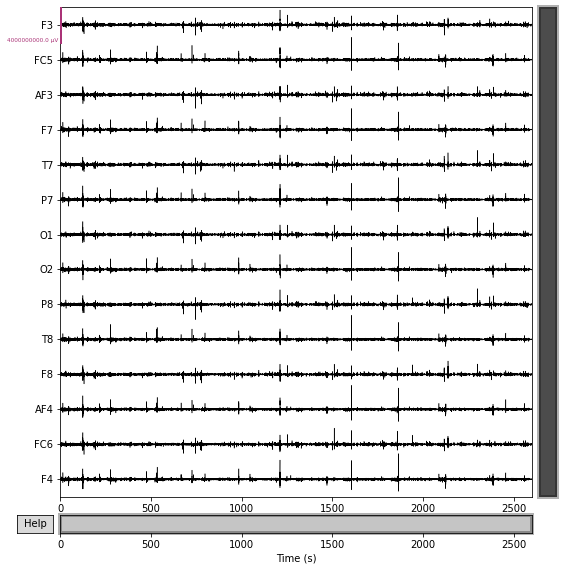

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


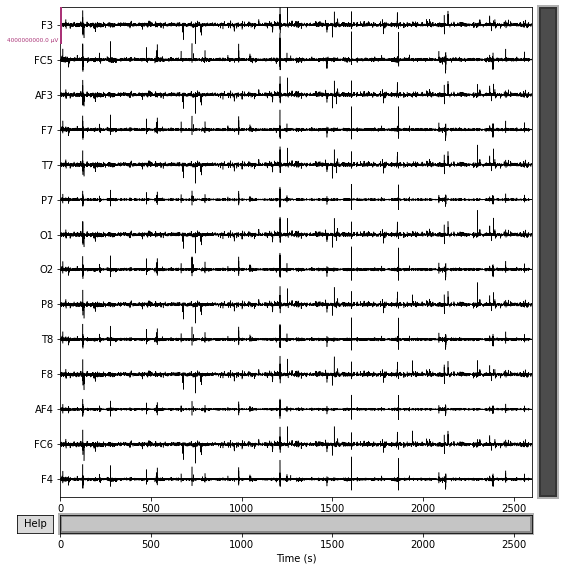

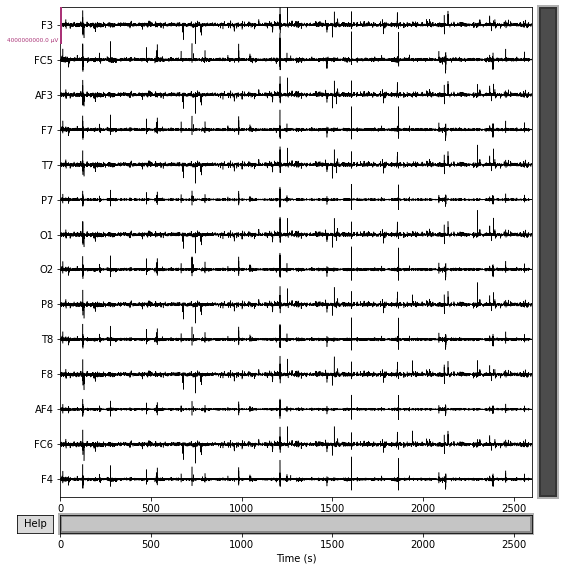

In [58]:
# Plots of Filtered, unfiltered and ICA processed data...
raw_speaking.plot(duration = 3000, scalings = 2000)
raw_speaking_filt.plot(duration = 3000, scalings = 2000)
speaking_processed_mne.plot(duration = 3000, scalings = 2000)

In [59]:
audio_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][audio_mne_processed.to_data_frame()['epoch'].unique()]
visual_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][visual_mne_processed.to_data_frame()['epoch'].unique()]
text_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][text_mne_processed.to_data_frame()['epoch'].unique()]
audio_labels.shape, visual_labels.shape, text_labels.shape# = audio_labels

((396,), (393,), (398,))

In [60]:
# Get the data into a numpy array for ML applications, with each row in the data containing all the features for a single epoch 
# (512*14 features for 512 time points and 14 channels)

speaking_processed = speaking_processed_mne.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
audio_df = audio_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
text_df = text_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
visual_df = visual_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
# visual_processed = visual_mne_processed.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
# text_processed = text_mne_processed.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
print(audio_df.shape[0]/512, speaking.shape[0]/512)

audio_processed = audio_df.to_numpy().reshape(audio_df.shape[0] // (512), 512 * 14)
text_processed = text_df.to_numpy().reshape(text_df.shape[0] // (512), 512 * 14)
visual_processed = visual_df.to_numpy().reshape(visual_df.shape[0] // (512), 512 * 14)

396.0 1300.0


In [61]:
speaking_processed.shape, audio_processed.shape, visual_processed.shape, text_processed.shape

((1300, 7168), (396, 7168), (393, 7168), (398, 7168))

# Feature extraction

In [62]:
X_train_aud, X_test_aud, y_train_aud, y_test_aud = train_test_split(audio_processed, audio_labels)

In [63]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_aud = onehot_encoder.fit_transform(y_train_aud[:, None])
y_train_IE_aud = np.argmax(y_train_aud, axis = 1)
y_test_aud = np.argmax(onehot_encoder.transform(y_test_aud[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_aud.shape, X_test_aud.shape, y_train_aud.shape, y_train_IE_aud.shape, y_test_aud.shape)
y_test_aud

(297, 7168) (99, 7168) (297, 4) (297,) (99,)


array([1, 2, 3, 0, 3, 3, 3, 3, 3, 0, 2, 2, 3, 1, 0, 1, 2, 2, 1, 1, 2, 3,
       0, 3, 2, 3, 1, 2, 1, 0, 2, 0, 3, 1, 2, 3, 3, 2, 1, 1, 0, 0, 0, 0,
       2, 2, 3, 3, 1, 1, 1, 3, 0, 0, 3, 1, 1, 0, 0, 3, 3, 0, 0, 3, 1, 3,
       2, 3, 2, 0, 3, 3, 1, 2, 0, 1, 2, 1, 2, 3, 1, 1, 0, 3, 0, 0, 0, 2,
       3, 0, 0, 0, 3, 0, 0, 3, 3, 2, 2])

In [64]:
pca = PCA(0.999)
X_train_PCA_aud = pca.fit_transform(X_train_aud)
X_test_PCA_aud = pca.transform(X_test_aud)
print(X_train_aud.shape, X_test_aud.shape, X_train_PCA_aud.shape, X_test_PCA_aud.shape)

(297, 7168) (99, 7168) (297, 283) (99, 283)


In [65]:
X_train_vis, X_test_vis, y_train_vis, y_test_vis = train_test_split(visual_processed, visual_labels)

In [66]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_vis = onehot_encoder.fit_transform(y_train_vis[:, None])
y_train_IE_vis = np.argmax(y_train_vis, axis = 1)
y_test_vis = np.argmax(onehot_encoder.transform(y_test_vis[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_vis.shape, X_test_vis.shape, y_train_vis.shape, y_train_IE_vis.shape, y_test_vis.shape)
y_test_vis

(294, 7168) (99, 7168) (294, 4) (294,) (99,)


array([2, 2, 3, 2, 1, 3, 1, 3, 1, 3, 0, 3, 3, 0, 2, 3, 0, 0, 1, 2, 3, 2,
       0, 1, 1, 0, 2, 0, 2, 3, 1, 2, 1, 1, 3, 2, 0, 3, 3, 2, 0, 0, 2, 1,
       1, 2, 2, 0, 2, 3, 0, 2, 3, 3, 1, 0, 1, 3, 2, 3, 1, 0, 3, 3, 1, 3,
       0, 1, 3, 3, 3, 0, 0, 1, 2, 0, 3, 2, 2, 3, 1, 3, 3, 2, 3, 2, 0, 0,
       1, 3, 2, 3, 1, 2, 3, 3, 1, 1, 1])

In [67]:
pca = PCA(0.999)
X_train_PCA_vis = pca.fit_transform(X_train_vis)
X_test_PCA_vis = pca.transform(X_test_vis)
print(X_train_vis.shape, X_test_vis.shape, X_train_PCA_vis.shape, X_test_PCA_vis.shape)

(294, 7168) (99, 7168) (294, 281) (99, 281)


In [68]:
X_train_text, X_test_text, y_train_text, y_test_text = train_test_split(text_processed, text_labels)

In [69]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_text = onehot_encoder.fit_transform(y_train_text[:, None])
y_train_IE_text = np.argmax(y_train_text, axis = 1)
y_test_text = np.argmax(onehot_encoder.transform(y_test_text[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_text.shape, X_test_text.shape, y_train_text.shape, y_train_IE_text.shape, y_test_text.shape)
y_test_text

(298, 7168) (100, 7168) (298, 4) (298,) (100,)


array([0, 2, 0, 0, 3, 2, 0, 1, 2, 3, 0, 3, 1, 0, 1, 2, 0, 2, 0, 3, 1, 2,
       0, 0, 3, 0, 1, 3, 3, 3, 3, 2, 2, 1, 1, 1, 2, 3, 1, 2, 0, 2, 0, 1,
       0, 0, 2, 0, 1, 3, 2, 0, 2, 0, 2, 1, 3, 0, 2, 0, 0, 3, 2, 1, 0, 2,
       0, 1, 1, 1, 3, 0, 0, 2, 2, 3, 3, 2, 1, 3, 1, 2, 1, 1, 2, 1, 0, 0,
       1, 3, 0, 2, 2, 0, 1, 3, 3, 0, 1, 2])

In [70]:
pca = PCA(0.999)
X_train_PCA_text = pca.fit_transform(X_train_text)
X_test_PCA_text = pca.transform(X_test_text)
print(X_train_text.shape, X_test_text.shape, X_train_PCA_text.shape, X_test_PCA_text.shape)

(298, 7168) (100, 7168) (298, 285) (100, 285)


# Application of ML models for audio data

In [71]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [72]:
%%time
# Train a model to classify speech...
nEpoch_DNN_aud = 500
nBatchSize_DNN_aud =4

DNN_simple_aud = Sequential()
DNN_simple_aud.add(Dense(50, input_dim= X_train_PCA_aud.shape[1]))
DNN_simple_aud.add(Dense(100, input_dim=100))
DNN_simple_aud.add(Dense(100, input_dim=100))
DNN_simple_aud.add(Dropout(0.2))
DNN_simple_aud.add(Dense(100, input_dim=100))
DNN_simple_aud.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_aud.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_aud.summary()
print(X_train_aud.shape, X_train_PCA_aud.shape, y_train_aud.shape)
simple_DNN_training_aud = DNN_simple_aud.fit(X_train_PCA_aud, y_train_aud, epochs=nEpoch_DNN_aud, batch_size=nBatchSize_DNN_aud)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                14200     
                                                                 
 dense_1 (Dense)             (None, 100)               5100      
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_3 (Dense)             (None, 100)               10100     
                                                                 
 dense_4 (Dense)             (None, 4)                 404       
                                                                 
Total params: 39,904
Trainable params: 39,904
Non-traina

In [73]:
#Generate predictions for the simple DNN
DNN_simple_pred_aud = np.argmax(DNN_simple_aud.predict(X_test_PCA_aud), axis = 1)
DNN_simple_pred_aud

#Calculate prediction accuracy...
accuracy_score(y_test_aud, DNN_simple_pred_aud[:, None])

0.21212121212121213

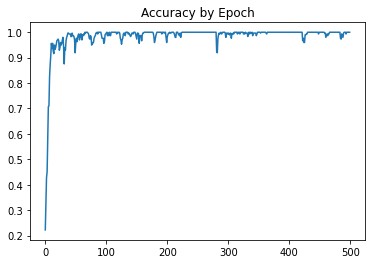

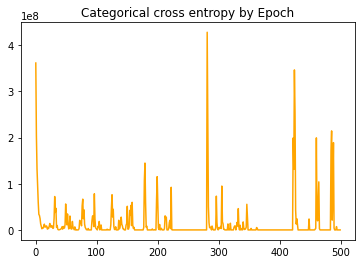

In [74]:
plt.plot(simple_DNN_training_aud.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_aud.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

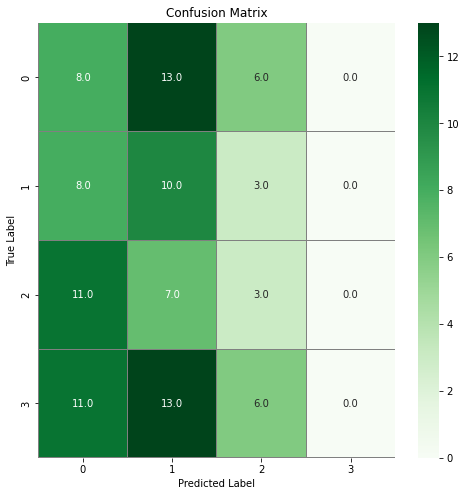

In [75]:
confusion_mtx = confusion_matrix(y_test_aud, DNN_simple_pred_aud[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [76]:
# # format data for input to the CNN...
X_train_CNN_aud = X_train_aud.reshape(X_train_aud.shape[0], 512, 14, 1)
X_test_CNN_aud = X_test_aud.reshape(X_test_aud.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [77]:
%%time
nEpoch_CNN_aud = 100
nBatchSize_CNN_aud = 4

CNN_simple_aud = Sequential()
#add model layers
CNN_simple_aud.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_aud.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_aud.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_aud.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_aud.add(Flatten())
CNN_simple_aud.add(Dropout(0.2))
CNN_simple_aud.add(Dense(4, activation= 'softmax'))
CNN_simple_aud.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_aud.summary()
simple_CNN_training_aud = CNN_simple_aud.fit(X_train_CNN_aud, y_train_aud, epochs=nEpoch_CNN_aud, batch_size=nBatchSize_CNN_aud)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 510, 12, 10)       100       
                                                                 
 conv2d_1 (Conv2D)           (None, 508, 10, 20)       1820      
                                                                 
 conv2d_2 (Conv2D)           (None, 506, 8, 20)        3620      
                                                                 
 conv2d_3 (Conv2D)           (None, 504, 6, 20)        3620      
                                                                 
 flatten (Flatten)           (None, 60480)             0         
                                                                 
 dropout_1 (Dropout)         (None, 60480)             0         
                                                                 
 dense_5 (Dense)             (None, 4)                

In [78]:
CNN_simple_pred_aud = np.argmax(CNN_simple_aud.predict(X_test_CNN_aud), axis = 1)
accuracy_score(y_test_aud, CNN_simple_pred_aud[:, None])

0.18181818181818182

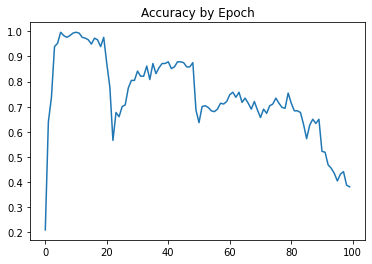

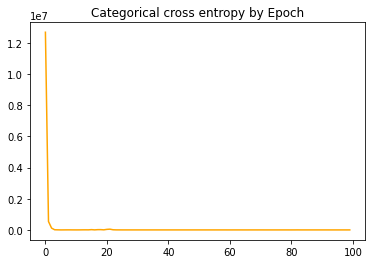

In [79]:
plt.plot(simple_CNN_training_aud.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_aud.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

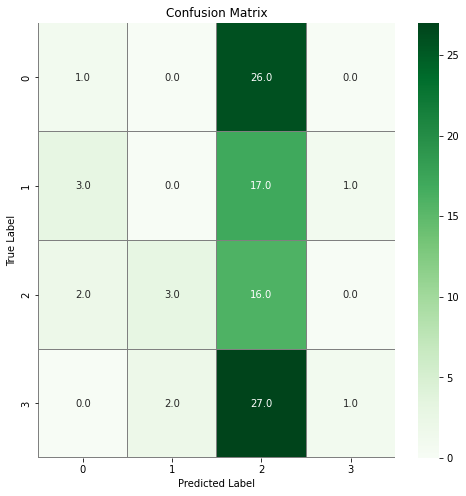

In [80]:
confusion_mtx = confusion_matrix(y_test_aud, CNN_simple_pred_aud[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [81]:
RF_train_aud = True

test_perf_RF_aud = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_aud:
    RF_init_aud= RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_aud.fit(X_train_PCA_aud, y_train_IE_aud)
    pickle.dump(RF_train_aud, open(str('RF_init_aud'), 'wb'))
else:
    RF_init_aud = pickle.load(open(str('RF_init_aud'), 'rb'))


(297,) (297,)
1 1
0.9932659932659933
0.30303030303030304


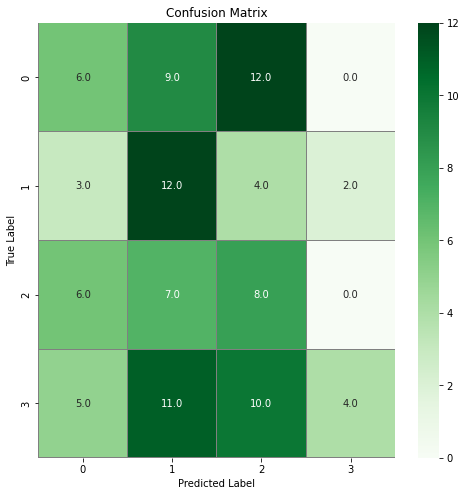

In [82]:
if test_perf_RF_aud:
    RF_init_pred_train_aud = (RF_init_aud.predict(X_train_PCA_aud))

    RF_init_pred_test_aud = (RF_init_aud.predict(X_test_PCA_aud))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_aud.shape, y_train_IE_aud.shape)
    print(RF_init_pred_train_aud[0], y_train_IE_aud[0])
    
    print(accuracy_score(RF_init_pred_train_aud, y_train_IE_aud))
    print(accuracy_score(RF_init_pred_test_aud, y_test_aud))
    confusion_mtx = confusion_matrix(y_test_aud, RF_init_pred_test_aud)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [83]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [84]:
%%time


RF_single_aud = RandomForestClassifier()

RF_single_random_search_aud = RandomizedSearchCV(estimator = RF_single_aud, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_aud.fit(X_train_PCA_aud, y_train_IE_aud)


print(RF_single_random_search_aud.best_params_)
RF_single_hps_aud = RF_single_random_search_aud.best_params_


Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 40}
CPU times: user 4.47 s, sys: 397 ms, total: 4.86 s
Wall time: 3min 43s


In [85]:
RF_single_hps_aud

{'n_estimators': 800,
 'min_samples_split': 10,
 'min_samples_leaf': 4,
 'max_depth': 40}

In [86]:
(RF_single_random_search_aud).cv_results_

{'mean_fit_time': array([3.56743727, 4.35601034, 5.01663852, 0.56082177, 4.58673167,
        4.06976752, 5.07216969, 2.02104406, 1.07535362, 1.53535442,
        3.95627089, 4.04494553, 3.33386979, 1.52034459, 0.51119251,
        5.05151496, 2.16665106, 4.31093802, 2.63527493, 2.78243399,
        2.53255367, 5.45575957, 2.97938113, 6.0357563 , 3.40668707,
        3.93431506, 5.05276031, 5.06795778, 4.72957549, 3.53512125,
        3.77501373, 4.98402739, 2.10265708, 4.32270532, 3.78943982,
        1.67098498, 3.76370969, 1.01252832, 2.11069884, 4.53455992,
        5.05909986, 4.19987693, 4.41363606, 1.68836145, 2.1531559 ,
        4.38342242, 3.65219936, 2.52771931, 2.6832963 , 0.53323827]),
 'std_fit_time': array([0.02122505, 0.02490529, 0.03129702, 0.0093764 , 0.03236101,
        0.02719113, 0.03544049, 0.00949407, 0.00390701, 0.02043554,
        0.02837976, 0.01407964, 0.02048305, 0.00941543, 0.00625305,
        0.02706095, 0.01984509, 0.01673745, 0.01896443, 0.01896441,
        0.023

1.0
0.3333333333333333


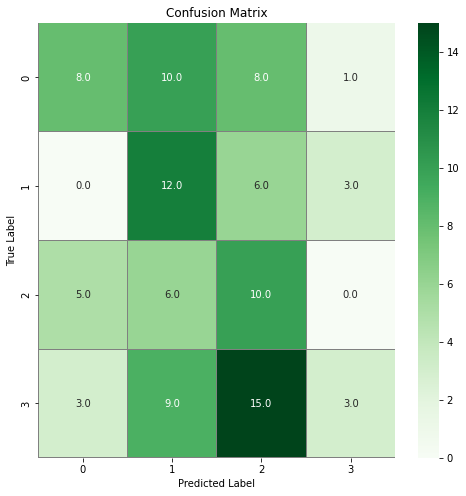

In [87]:
RF_tuned_aud = RandomForestClassifier(n_estimators = RF_single_random_search_aud.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_aud['max_depth'],
                                  min_samples_split = RF_single_hps_aud['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_aud['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_aud.fit(X_train_PCA_aud, y_train_IE_aud)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_aud, open(str('RF_tuned_aud'), 'wb'))

RF_tuned_aud_pred_train = (RF_tuned_aud.predict(X_train_PCA_aud))

RF_tuned_aud_pred_test = (RF_tuned_aud.predict(X_test_PCA_aud))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_aud_pred_train, y_train_IE_aud))
print(accuracy_score(RF_tuned_aud_pred_test, y_test_aud))
confusion_mtx = confusion_matrix(y_test_aud, RF_tuned_aud_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for text data

In [88]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [89]:
%%time
# Train a model to classify speech...
nEpoch_DNN_text = 500
nBatchSize_DNN_text =4

DNN_simple_text = Sequential()
DNN_simple_text.add(Dense(50, input_dim= X_train_PCA_text.shape[1]))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dropout(0.2))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_text.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_text.summary()
print(X_train_text.shape, X_train_PCA_text.shape, y_train_text.shape)
simple_DNN_training_text = DNN_simple_text.fit(X_train_PCA_text, y_train_text, epochs=nEpoch_DNN_text, batch_size=nBatchSize_DNN_text)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 50)                14300     
                                                                 
 dense_7 (Dense)             (None, 100)               5100      
                                                                 
 dense_8 (Dense)             (None, 100)               10100     
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 dense_9 (Dense)             (None, 100)               10100     
                                                                 
 dense_10 (Dense)            (None, 4)                 404       
                                                                 
Total params: 40,004
Trainable params: 40,004
Non-trai

In [90]:
#Generate predictions for the simple DNN
DNN_simple_pred_text = np.argmax(DNN_simple_text.predict(X_test_PCA_text), axis = 1)
DNN_simple_pred_text

#Calculate prediction accuracy...
accuracy_score(y_test_text, DNN_simple_pred_text[:, None])

0.33

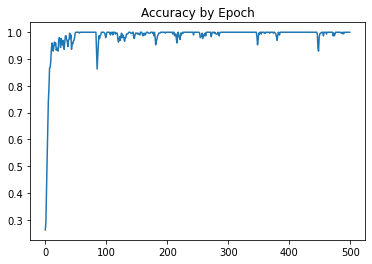

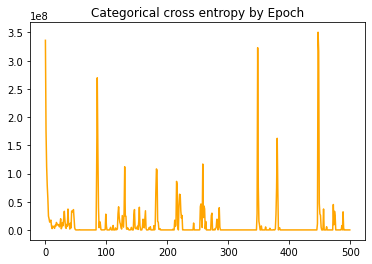

In [91]:
plt.plot(simple_DNN_training_text.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_text.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

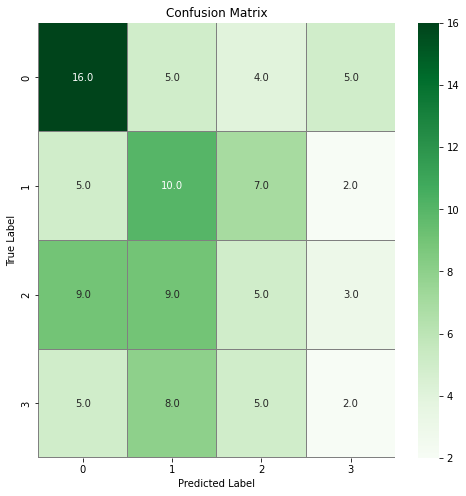

In [92]:
confusion_mtx = confusion_matrix(y_test_text, DNN_simple_pred_text[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [93]:
# # format data for input to the CNN...
X_train_CNN_text = X_train_text.reshape(X_train_text.shape[0], 512, 14, 1)
X_test_CNN_text = X_test_text.reshape(X_test_text.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [94]:
%%time
nEpoch_CNN_text = 100
nBatchSize_CNN_text = 4

CNN_simple_text = Sequential()
#add model layers
CNN_simple_text.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Flatten())
CNN_simple_text.add(Dropout(0.2))
CNN_simple_text.add(Dense(4, activation= 'softmax'))
CNN_simple_text.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_text.summary()
simple_CNN_training_text = CNN_simple_text.fit(X_train_CNN_text, y_train_text, epochs=nEpoch_CNN_text, batch_size=nBatchSize_CNN_text)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 510, 12, 10)       100       
                                                                 
 conv2d_5 (Conv2D)           (None, 508, 10, 20)       1820      
                                                                 
 conv2d_6 (Conv2D)           (None, 506, 8, 20)        3620      
                                                                 
 conv2d_7 (Conv2D)           (None, 504, 6, 20)        3620      
                                                                 
 flatten_1 (Flatten)         (None, 60480)             0         
                                                                 
 dropout_3 (Dropout)         (None, 60480)             0         
                                                                 
 dense_11 (Dense)            (None, 4)                

In [95]:
CNN_simple_pred_text = np.argmax(CNN_simple_text.predict(X_test_CNN_text), axis = 1)
accuracy_score(y_test_text, CNN_simple_pred_text[:, None])

0.2

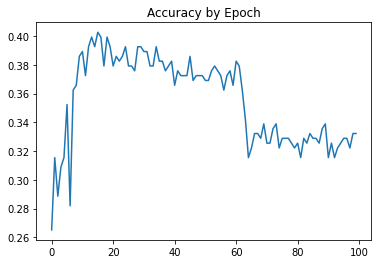

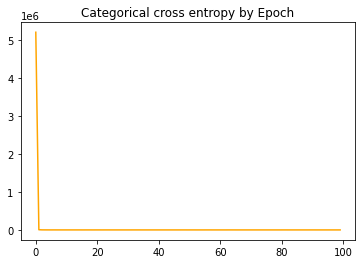

In [96]:
plt.plot(simple_CNN_training_text.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_text.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

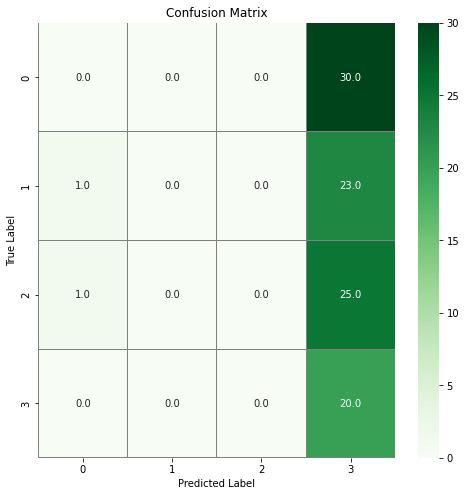

In [97]:
confusion_mtx = confusion_matrix(y_test_text, CNN_simple_pred_text[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [98]:
RF_train_text = True

test_perf_RF_text = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_text:
    RF_init_text= RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_text.fit(X_train_PCA_text, y_train_IE_text)
    pickle.dump(RF_train_text, open(str('RF_init_text'), 'wb'))
else:
    RF_init_text = pickle.load(open(str('RF_init_text'), 'rb'))


(298,) (298,)
3 3
0.9932885906040269
0.25


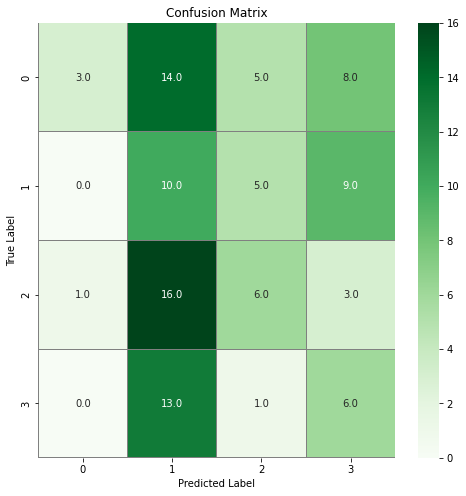

In [99]:
if test_perf_RF_text:
    RF_init_pred_train_text = (RF_init_text.predict(X_train_PCA_text))

    RF_init_pred_test_text = (RF_init_text.predict(X_test_PCA_text))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_text.shape, y_train_IE_text.shape)
    print(RF_init_pred_train_text[0], y_train_IE_text[0])
    
    print(accuracy_score(RF_init_pred_train_text, y_train_IE_text))
    print(accuracy_score(RF_init_pred_test_text, y_test_text))
    confusion_mtx = confusion_matrix(y_test_text, RF_init_pred_test_text)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [100]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [101]:
%%time


RF_single_text = RandomForestClassifier()

RF_single_random_search_text = RandomizedSearchCV(estimator = RF_single_text, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_text.fit(X_train_PCA_text, y_train_IE_text)


print(RF_single_random_search_text.best_params_)
RF_single_hps_text = RF_single_random_search_text.best_params_


Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 10}
CPU times: user 3.98 s, sys: 287 ms, total: 4.27 s
Wall time: 3min 39s


In [102]:
RF_single_hps_text

{'n_estimators': 800,
 'min_samples_split': 10,
 'min_samples_leaf': 4,
 'max_depth': 10}

In [103]:
(RF_single_random_search_text).cv_results_

{'mean_fit_time': array([1.55338111, 4.42777143, 3.38048949, 3.56869898, 5.32788253,
        1.6638267 , 3.19723387, 2.74748878, 2.02024498, 0.56232009,
        2.6734827 , 1.029528  , 2.15624242, 3.41366277, 3.85032802,
        3.28182311, 5.53001909, 4.38449626, 5.03045778, 1.63795247,
        4.11189871, 4.39873223, 3.20204134, 2.26394367, 0.51994696,
        0.50836763, 1.53435464, 2.57566004, 2.75941877, 4.55413656,
        4.52992821, 3.32871914, 5.01960192, 4.09704351, 1.53341765,
        5.5036973 , 5.0738009 , 3.19820213, 2.84198079, 5.46980653,
        4.26625319, 2.20031729, 5.63625989, 3.93563066, 2.18822179,
        4.56094165, 2.0674922 , 5.41824732, 4.99542856, 1.05897255]),
 'std_fit_time': array([0.00678888, 0.02423594, 0.02148271, 0.02193018, 0.01614162,
        0.0124236 , 0.01382195, 0.00866176, 0.02598291, 0.00360381,
        0.0180398 , 0.00782712, 0.01129636, 0.01240149, 0.0239035 ,
        0.02168551, 0.01345118, 0.02566393, 0.01771442, 0.01994855,
        0.016

1.0
0.21


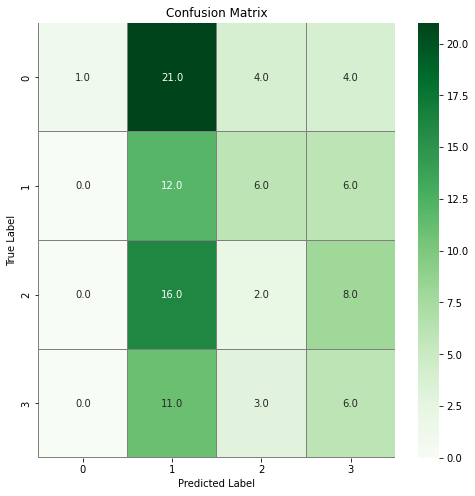

In [104]:
RF_tuned_text = RandomForestClassifier(n_estimators = RF_single_random_search_text.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_text['max_depth'],
                                  min_samples_split = RF_single_hps_text['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_text['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_text.fit(X_train_PCA_text, y_train_IE_text)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_text, open(str('RF_tuned_text'), 'wb'))

RF_tuned_text_pred_train = (RF_tuned_text.predict(X_train_PCA_text))

RF_tuned_text_pred_test = (RF_tuned_text.predict(X_test_PCA_text))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_text_pred_train, y_train_IE_text))
print(accuracy_score(RF_tuned_text_pred_test, y_test_text))
confusion_mtx = confusion_matrix(y_test_text, RF_tuned_text_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for visual data

In [105]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [106]:
%%time
# Train a model to classify speech...
nEpoch_DNN_vis = 500
nBatchSize_DNN_vis =4

DNN_simple_vis = Sequential()
DNN_simple_vis.add(Dense(50, input_dim= X_train_PCA_vis.shape[1]))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dropout(0.2))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_vis.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_vis.summary()
print(X_train_vis.shape, X_train_PCA_vis.shape, y_train_vis.shape)
simple_DNN_training_vis = DNN_simple_vis.fit(X_train_PCA_vis, y_train_vis, epochs=nEpoch_DNN_vis, batch_size=nBatchSize_DNN_vis)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 50)                14100     
                                                                 
 dense_13 (Dense)            (None, 100)               5100      
                                                                 
 dense_14 (Dense)            (None, 100)               10100     
                                                                 
 dropout_4 (Dropout)         (None, 100)               0         
                                                                 
 dense_15 (Dense)            (None, 100)               10100     
                                                                 
 dense_16 (Dense)            (None, 4)                 404       
                                                                 
Total params: 39,804
Trainable params: 39,804
Non-trai

In [107]:
#Generate predictions for the simple DNN
DNN_simple_pred_vis = np.argmax(DNN_simple_vis.predict(X_test_PCA_vis), axis = 1)
DNN_simple_pred_vis

#Calculate prediction accuracy...
accuracy_score(y_test_vis, DNN_simple_pred_vis[:, None])

0.16161616161616163

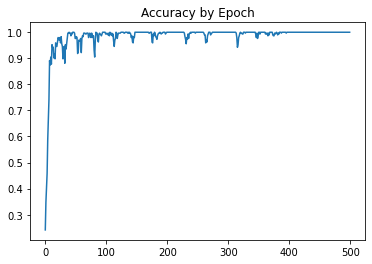

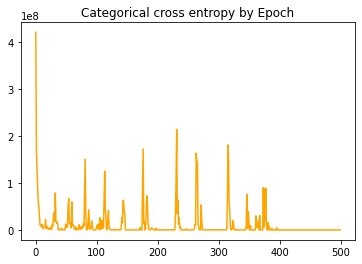

In [108]:
plt.plot(simple_DNN_training_vis.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_vis.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

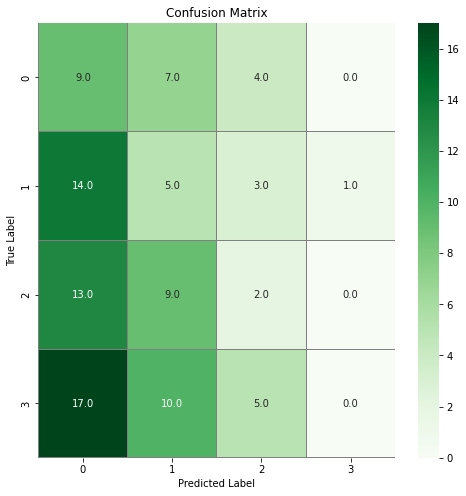

In [109]:
confusion_mtx = confusion_matrix(y_test_vis, DNN_simple_pred_vis[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [110]:
# # format data for input to the CNN...
X_train_CNN_vis = X_train_vis.reshape(X_train_vis.shape[0], 512, 14, 1)
X_test_CNN_vis = X_test_vis.reshape(X_test_vis.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [111]:
%%time
nEpoch_CNN_vis = 100
nBatchSize_CNN_vis = 4

CNN_simple_vis = Sequential()
#add model layers
CNN_simple_vis.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Flatten())
CNN_simple_vis.add(Dropout(0.2))
CNN_simple_vis.add(Dense(4, activation= 'softmax'))
CNN_simple_vis.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_vis.summary()
simple_CNN_training_vis = CNN_simple_vis.fit(X_train_CNN_vis, y_train_vis, epochs=nEpoch_CNN_vis, batch_size=nBatchSize_CNN_vis)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 510, 12, 10)       100       
                                                                 
 conv2d_9 (Conv2D)           (None, 508, 10, 20)       1820      
                                                                 
 conv2d_10 (Conv2D)          (None, 506, 8, 20)        3620      
                                                                 
 conv2d_11 (Conv2D)          (None, 504, 6, 20)        3620      
                                                                 
 flatten_2 (Flatten)         (None, 60480)             0         
                                                                 
 dropout_5 (Dropout)         (None, 60480)             0         
                                                                 
 dense_17 (Dense)            (None, 4)                

In [112]:
CNN_simple_pred_vis = np.argmax(CNN_simple_vis.predict(X_test_CNN_vis), axis = 1)
accuracy_score(y_test_vis, CNN_simple_pred_vis[:, None])

0.25252525252525254

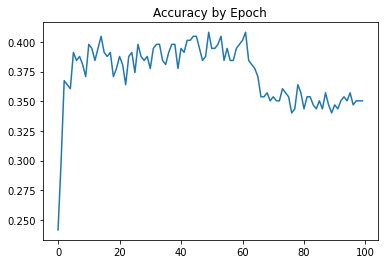

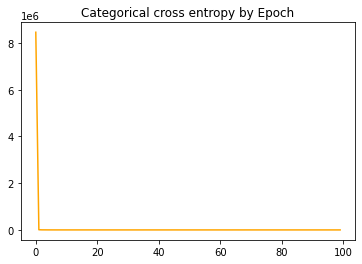

In [113]:
plt.plot(simple_CNN_training_vis.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_vis.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

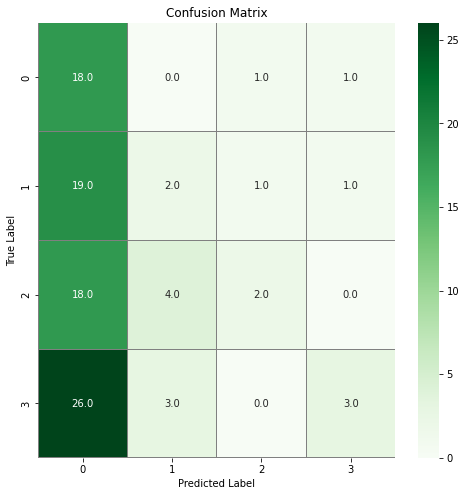

In [114]:
confusion_mtx = confusion_matrix(y_test_vis, CNN_simple_pred_vis[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [115]:
RF_train_vis = True

test_perf_RF_vis = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_vis:
    RF_init_vis = RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_vis.fit(X_train_PCA_vis, y_train_IE_vis)
    pickle.dump(RF_train_vis, open(str('RF_init_vis'), 'wb'))
else:
    RF_init_vis = pickle.load(open(str('RF_init_vis'), 'rb'))


(294,) (294,)
0 0
0.9931972789115646
0.21212121212121213


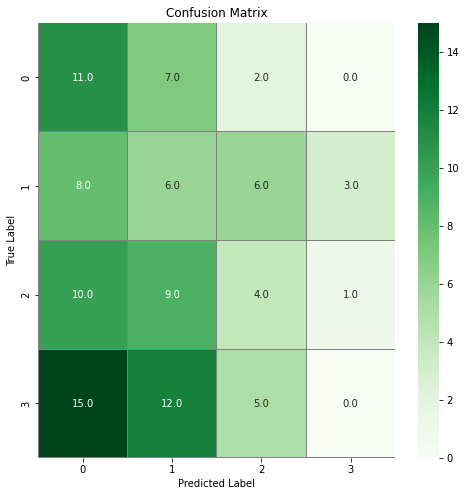

In [116]:
if test_perf_RF_vis:
    RF_init_pred_train_vis = (RF_init_vis.predict(X_train_PCA_vis))

    RF_init_pred_test_vis = (RF_init_vis.predict(X_test_PCA_vis))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_vis.shape, y_train_IE_vis.shape)
    print(RF_init_pred_train_vis[0], y_train_IE_vis[0])
    
    print(accuracy_score(RF_init_pred_train_vis, y_train_IE_vis))
    print(accuracy_score(RF_init_pred_test_vis, y_test_vis))
    confusion_mtx = confusion_matrix(y_test_vis, RF_init_pred_test_vis)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [117]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [118]:
%%time


RF_single_vis = RandomForestClassifier()

RF_single_random_search_vis = RandomizedSearchCV(estimator = RF_single_vis, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_vis.fit(X_train_PCA_vis, y_train_IE_vis)


print(RF_single_random_search_vis.best_params_)
RF_single_hps_vis = RF_single_random_search_vis.best_params_


Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1400, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 20}
CPU times: user 5.97 s, sys: 196 ms, total: 6.17 s
Wall time: 3min 31s


In [119]:
RF_single_hps_vis

{'n_estimators': 1400,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_depth': 20}

In [120]:
(RF_single_random_search_vis).cv_results_

{'mean_fit_time': array([1.6863565 , 3.45498323, 3.71563282, 3.93374524, 4.82465677,
        0.55586967, 2.16209297, 2.80556302, 1.0101748 , 1.5381669 ,
        0.56892328, 5.09406557, 4.87966247, 3.16030264, 4.87094345,
        0.55116448, 1.53010511, 2.17038646, 2.01416149, 4.8910512 ,
        4.59741745, 3.76302752, 5.42765636, 5.42156906, 1.02174282,
        1.63994222, 1.62850904, 4.32457366, 4.53773346, 2.1637032 ,
        2.72379646, 4.05905614, 3.39934354, 5.05483751, 4.49701891,
        3.05156393, 3.90602179, 0.55035505, 2.0349875 , 1.11023307,
        4.11303635, 3.2664422 , 1.2546957 , 4.91109881, 3.08772287,
        5.94084997, 2.46072683, 4.08159308, 4.99013314, 3.48720002]),
 'std_fit_time': array([0.02281953, 0.02014445, 0.02642338, 0.02028147, 0.03525005,
        0.01053763, 0.02899513, 0.02405534, 0.00990862, 0.02719808,
        0.01378373, 0.04491392, 0.03513899, 0.02055734, 0.02507043,
        0.00795376, 0.02066938, 0.00671883, 0.02381661, 0.03243159,
        0.035

1.0
0.26262626262626265


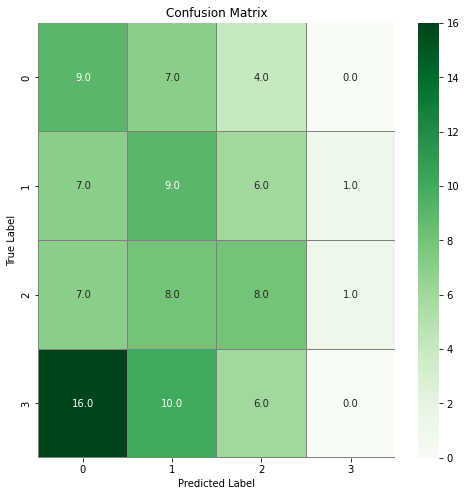

In [121]:
RF_tuned_vis = RandomForestClassifier(n_estimators = RF_single_random_search_vis.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_vis['max_depth'],
                                  min_samples_split = RF_single_hps_vis['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_vis['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_vis.fit(X_train_PCA_vis, y_train_IE_vis)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_vis, open(str('RF_tuned_vis'), 'wb'))

RF_tuned_vis_pred_train = (RF_tuned_vis.predict(X_train_PCA_vis))

RF_tuned_vis_pred_test = (RF_tuned_vis.predict(X_test_PCA_vis))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_vis_pred_train, y_train_IE_vis))
print(accuracy_score(RF_tuned_vis_pred_test, y_test_vis))
confusion_mtx = confusion_matrix(y_test_vis, RF_tuned_vis_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()